## Drone delivery

In [2]:
# 导入必要的库
import gurobipy as gp
import math
from gurobipy import Model, GRB, quicksum, tupledict
from itertools import combinations
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

In [3]:
# Define the file path
file_path = 'dataset/pdp_100/lr210.txt'

# Read the file lines
with open(file_path, 'r') as file:
    lines = file.readlines()

# First line corresponds to the first DataFrame with number of vehicles, vehicle capacity, and speed
header_data = lines[0].strip().split('\t')
header_df = pd.DataFrame([header_data], columns=["NUMBER OF VEHICLES", "VEHICLE CAPACITY", "SPEED (not used)"])

# The remaining lines correspond to the second DataFrame with task details
task_data = [line.strip().split('\t') for line in lines[1:]]
columns = ["TASK NO.", "X", "Y", "DEMAND", "EARLIEST PICKUP/DELIVERY TIME", 
           "LATEST PICKUP/DELIVERY TIME", "SERVICE TIME", "PICKUP(index to sibling)", "DELIVERY(index to sibling)"]
task_df = pd.DataFrame(task_data, columns=columns)

# Display the dataframes
print("Header DataFrame:")
print(header_df)

print("\nTask Details DataFrame:")
print(task_df)

Header DataFrame:
  NUMBER OF VEHICLES VEHICLE CAPACITY SPEED (not used)
0                 25             1000                1

Task Details DataFrame:
    TASK NO.   X   Y DEMAND EARLIEST PICKUP/DELIVERY TIME  \
0          0  35  35      0                             0   
1          1  41  49     10                           190   
2          2  35  17    -41                            18   
3          3  55  45     -5                           289   
4          4  55  20     19                           679   
..       ...  ..  ..    ...                           ...   
98        98  19  21     10                            21   
99        99  20  26      9                           328   
100      100  18  18    -31                           821   
101      101  53  12     -6                           525   
102      102  15  77     -9                           154   

    LATEST PICKUP/DELIVERY TIME SERVICE TIME PICKUP(index to sibling)  \
0                          1000          

In [4]:
task_df

,TASK NO.,X,Y,DEMAND,EARLIEST PICKUP/DELIVERY TIME,LATEST PICKUP/DELIVERY TIME,SERVICE TIME,PICKUP(index to sibling),DELIVERY(index to sibling)
0,0,35,35,0,0,1000,0,0,0
1,1,41,49,10,190,974,10,0,70
2,2,35,17,-41,18,792,10,85,0
3,3,55,45,-5,289,822,10,42,0
4,4,55,20,19,679,800,10,0,55
...,...,...,...,...,...,...,...,...,...
98,98,19,21,10,21,748,10,0,67
99,99,20,26,9,328,437,10,0,22
100,100,18,18,-31,821,965,10,39,0
101,101,53,12,-6,525,752,10,56,0


In [5]:
# 将 DEMAND 列转换为整数类型
task_df = task_df.apply(pd.to_numeric, errors='coerce')


# 定义一个函数来判断任务类型
def determine_task_type(row):

    if row["DEMAND"] < 0:
        return "pickup"
    elif row["DEMAND"] > 0:
        return "delivery"
    else:
        return "depot"

# 应用函数并新增一列
task_df['TASK TYPE'] = task_df.apply(determine_task_type, axis=1)


In [6]:
task_df

,TASK NO.,X,Y,DEMAND,EARLIEST PICKUP/DELIVERY TIME,LATEST PICKUP/DELIVERY TIME,SERVICE TIME,PICKUP(index to sibling),DELIVERY(index to sibling),TASK TYPE
0,0,35,35,0,0,1000,0,0,0,depot
1,1,41,49,10,190,974,10,0,70,delivery
2,2,35,17,-41,18,792,10,85,0,pickup
3,3,55,45,-5,289,822,10,42,0,pickup
4,4,55,20,19,679,800,10,0,55,delivery
...,...,...,...,...,...,...,...,...,...,...
98,98,19,21,10,21,748,10,0,67,delivery
99,99,20,26,9,328,437,10,0,22,delivery
100,100,18,18,-31,821,965,10,39,0,pickup
101,101,53,12,-6,525,752,10,56,0,pickup


	1.	任务 0:
	•	TASK NO. 0 是仓库（Depot），它的坐标是 (40, 50)，需求量（DEMAND）为 0。
	•	任务 0 的 PICKUP(index to sibling) 和 DELIVERY(index to sibling) 都是 0，表示这是仓库，不涉及取货或送货操作。

	2.	任务 1:
	•	TASK NO. 1 是一个送货任务，坐标是 (45, 68)，需求量（DEMAND）是 -10，表示需要把 10 单位的货物送到这个地点。
	•	任务 1 的 PICKUP(index to sibling) 为 2，表示任务 1 的对应取货任务是 TASK NO. 2。
	 red line: from green point to orange point
	
	3.	任务 2:
	•	TASK NO. 2 是一个取货任务，坐标和任务 1 一样都是 (45, 68)，需求量（DEMAND）是 10，表示需要从这个地点取 10 单位的货物。
	•	任务 2 的 DELIVERY(index to sibling) 为 1，表示任务 2 的对应送货任务是 TASK NO. 1。
	 blue line: from green point to orange point


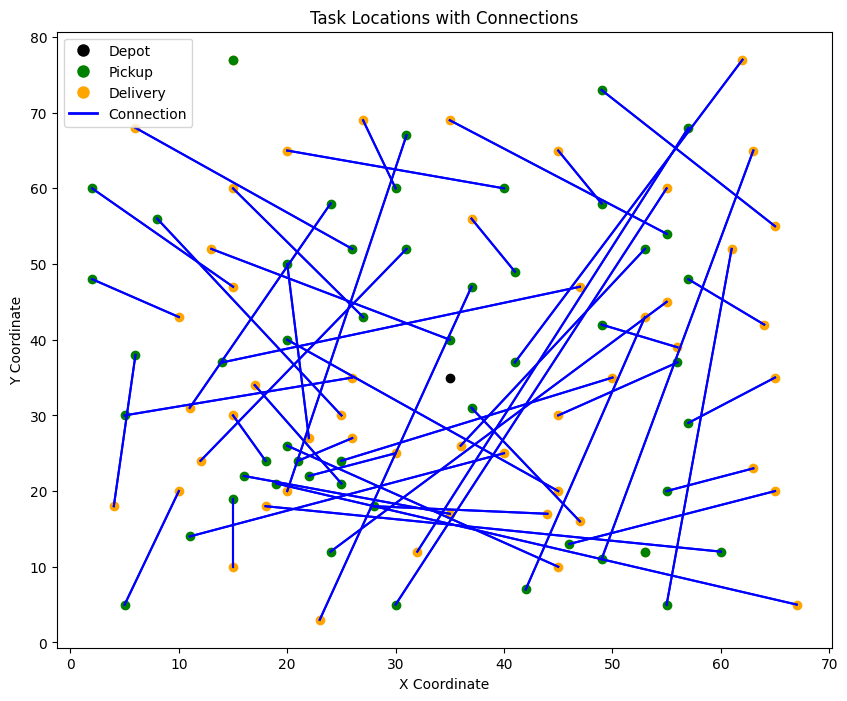

In [7]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# 假设 task_df 已经被创建，并且所有列都已经转换为数值类型
# 将 'PICKUP(index to sibling)' 和 'DELIVERY(index to sibling)' 合并为 'CONNECTION' 列
task_df['CONNECTION'] = task_df[['PICKUP(index to sibling)', 'DELIVERY(index to sibling)']].max(axis=1)
task_df['CONNECTION'] = pd.to_numeric(task_df['CONNECTION'], errors='coerce').fillna(0).astype(int)

# 创建 'photos' 文件夹，如果它不存在
os.makedirs('photos', exist_ok=True)

# 先创建一个空白图
plt.figure(figsize=(10, 8))

# 遍历每一行
for _, row in task_df.iterrows():
    task_type = row['TASK TYPE']
    x, y = row['X'], row['Y']
    
    if task_type == 'depot':
        # 绘制仓库（黑色）
        plt.scatter(x, y, color='black')
    
    elif task_type in ['pickup', 'delivery']:
        # 找到对应的连接任务
        sibling_index = row['CONNECTION']
        if sibling_index > 0:
            sibling_row = task_df.iloc[sibling_index]
            sibling_x, sibling_y = sibling_row['X'], sibling_row['Y']
            
            # 绘制连接任务（绿色）
            plt.scatter(sibling_x, sibling_y, color='green' if task_type == 'pickup' else 'orange')
            
            # 绘制连接线（蓝色）
            plt.plot([x, sibling_x], [y, sibling_y], color='blue')
        else:
            # 单独绘制 pickup 或 delivery 任务
            plt.scatter(x, y, color='green' if task_type == 'pickup' else 'orange')

# 添加图例
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=10, label='Depot'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Pickup'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Delivery'),
    plt.Line2D([0], [0], color='blue', lw=2, label='Connection')
])

# 设置标题和标签
plt.title('Task Locations with Connections')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')



# 显示图表
plt.grid(False)
plt.show()

In [8]:

# 创建一个空的列表来存储配对数据
pairs = []

# 遍历每一行，找到pickup和对应的delivery
for _, row in task_df.iterrows():
    if row['TASK TYPE'] == 'pickup':
        # 找到对应的delivery任务
        sibling_index = row['CONNECTION']
        sibling_row = task_df.iloc[sibling_index]
        
        # 将pickup和delivery任务配对，并存入列表
        pair = {
            'pickup_task': row['TASK NO.'],
            'pickup_x': row['X'],
            'pickup_y': row['Y'],
            'pickup_earliest_time': row['EARLIEST PICKUP/DELIVERY TIME'],
            'pickup_latest_time': row['LATEST PICKUP/DELIVERY TIME'],
            'delivery_task': sibling_row['TASK NO.'],
            'delivery_x': sibling_row['X'],
            'delivery_y': sibling_row['Y'],
            'delivery_earliest_time': sibling_row['EARLIEST PICKUP/DELIVERY TIME'],
            'delivery_latest_time': sibling_row['LATEST PICKUP/DELIVERY TIME']
        }
        pairs.append(pair)

# 将列表转换为DataFrame
pairs_df = pd.DataFrame(pairs)

# 计算每对任务之间的欧几里得距离
pairs_df['distance'] = pairs_df.apply(lambda row: np.sqrt((row['pickup_x'] - row['delivery_x'])**2 +
                                                          (row['pickup_y'] - row['delivery_y'])**2), axis=1)

# 输出配对数据
pairs_df

,pickup_task,pickup_x,pickup_y,pickup_earliest_time,pickup_latest_time,delivery_task,delivery_x,delivery_y,delivery_earliest_time,delivery_latest_time,distance
0,2,35,17,18,792,85,16,22,110,727,19.646883
1,3,55,45,289,822,42,24,12,25,292,45.276926
2,5,15,30,20,906,93,18,24,691,969,6.708204
3,6,25,30,355,574,47,8,56,34,602,31.064449
4,8,10,43,393,492,46,2,48,338,805,9.433981
5,9,55,60,394,503,15,30,5,176,299,60.415230
6,11,20,65,206,325,30,40,60,199,414,20.615528
7,12,50,35,15,725,95,25,24,14,793,27.313001
8,13,30,25,694,823,92,22,22,18,159,8.544004
9,14,15,10,32,694,91,15,19,222,964,9.000000


In [9]:
# 创建一个布尔掩码来找出取货点和送货点不重合的行
mask = ~((pairs_df['pickup_x'] == pairs_df['delivery_x']) & 
         (pairs_df['pickup_y'] == pairs_df['delivery_y']))

# 应用掩码来过滤数据
cleaned_pairs_df = pairs_df[mask].copy()

# 打印清理前后的数据行数，看看删除了多少行
print(f"Original number of rows: {len(pairs_df)}")
print(f"Number of rows after cleaning: {len(cleaned_pairs_df)}")
print(f"Removed {len(pairs_df) - len(cleaned_pairs_df)} duplicate location pairs")

# 如果需要，可以将清理后的数据帧重置索引
cleaned_pairs_df = cleaned_pairs_df.reset_index(drop=True)

# 替换原来的数据帧
pairs_df = cleaned_pairs_df
pairs_df

Original number of rows: 51
Number of rows after cleaning: 49
Removed 2 duplicate location pairs


,pickup_task,pickup_x,pickup_y,pickup_earliest_time,pickup_latest_time,delivery_task,delivery_x,delivery_y,delivery_earliest_time,delivery_latest_time,distance
0,2,35,17,18,792,85,16,22,110,727,19.646883
1,3,55,45,289,822,42,24,12,25,292,45.276926
2,5,15,30,20,906,93,18,24,691,969,6.708204
3,6,25,30,355,574,47,8,56,34,602,31.064449
4,8,10,43,393,492,46,2,48,338,805,9.433981
5,9,55,60,394,503,15,30,5,176,299,60.415230
6,11,20,65,206,325,30,40,60,199,414,20.615528
7,12,50,35,15,725,95,25,24,14,793,27.313001
8,13,30,25,694,823,92,22,22,18,159,8.544004
9,14,15,10,32,694,91,15,19,222,964,9.000000


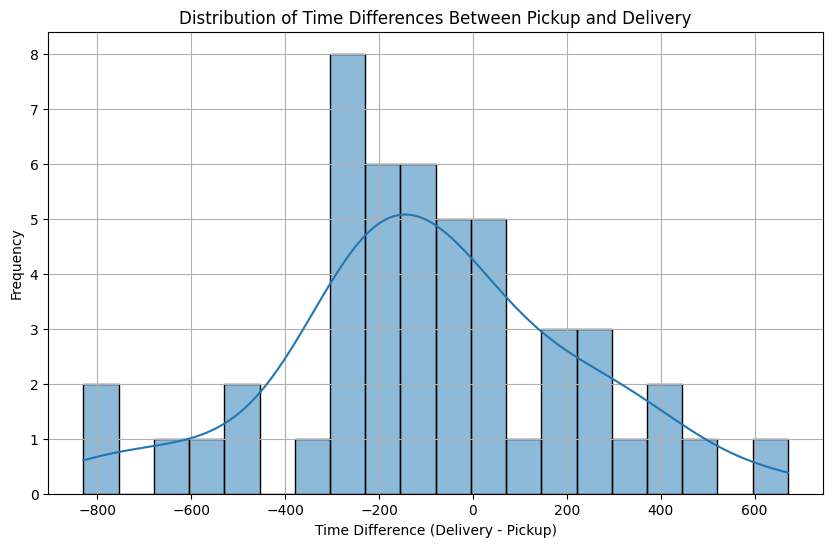

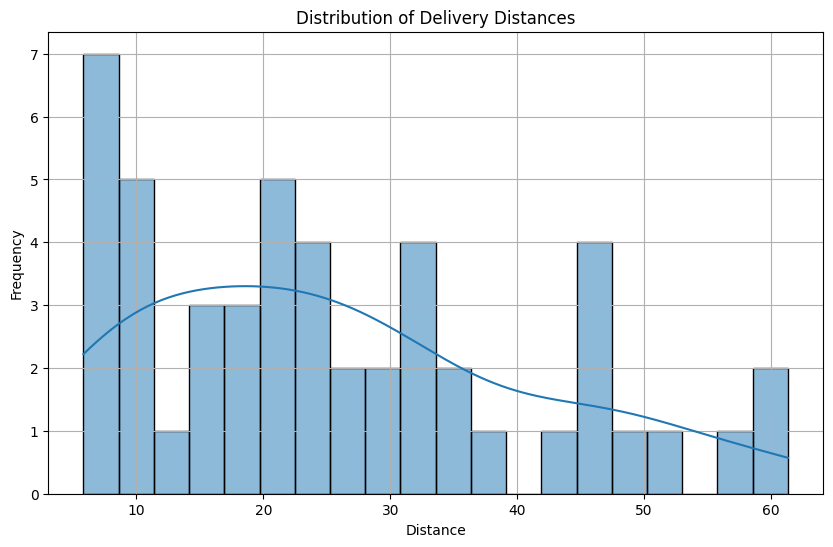

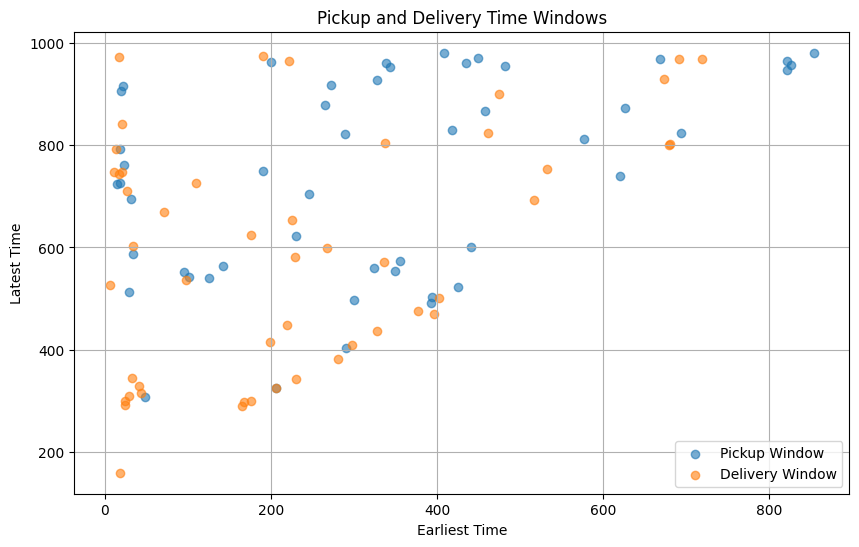

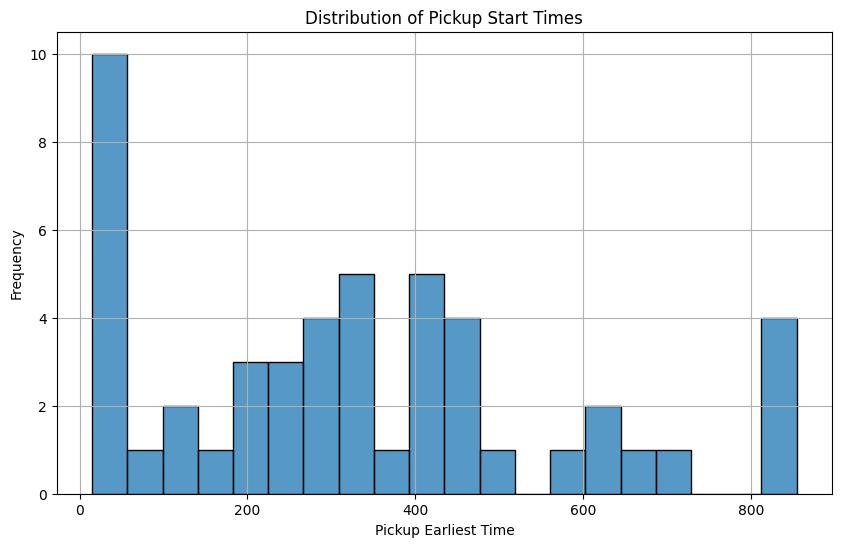

In [10]:
############整一个list或者dictionary来record，把pickup time排序，然后每个index对应一个earliest pick point，然后一个一个go through
#######可以假设有无数个delivery drones，当我有一个pick up task，然后就有一个drone在等待，如果没有等待就加一个新的drone
############下一个task是考虑delivery，就直接假设每次我开始pick up的时候就有一个drone在等待，并进行之后的deliver
import matplotlib.pyplot as plt

import seaborn as sns

# 1. 计算取货和送货的时间差
pairs_df['time_difference'] = pairs_df['delivery_earliest_time'] - pairs_df['pickup_earliest_time']

# 绘制取货和送货的时间间隔分布
plt.figure(figsize=(10, 6))
sns.histplot(pairs_df['time_difference'], bins=20, kde=True)
plt.title('Distribution of Time Differences Between Pickup and Delivery')
plt.xlabel('Time Difference (Delivery - Pickup)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 2. 绘制任务距离的分布情况
plt.figure(figsize=(10, 6))
sns.histplot(pairs_df['distance'], bins=20, kde=True)
plt.title('Distribution of Delivery Distances')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 3. 取货/送货的时间窗口散点图
plt.figure(figsize=(10, 6))
plt.scatter(pairs_df['pickup_earliest_time'], pairs_df['pickup_latest_time'], label='Pickup Window', alpha=0.6)
plt.scatter(pairs_df['delivery_earliest_time'], pairs_df['delivery_latest_time'], label='Delivery Window', alpha=0.6)
plt.title('Pickup and Delivery Time Windows')
plt.xlabel('Earliest Time')
plt.ylabel('Latest Time')
plt.legend()
plt.grid(True)
plt.show()

# 4. 任务开始时间的条形图
plt.figure(figsize=(10, 6))
sns.histplot(pairs_df['pickup_earliest_time'], bins=20, kde=False)
plt.title('Distribution of Pickup Start Times')
plt.xlabel('Pickup Earliest Time')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [11]:
# import matplotlib.pyplot as plt
# import pandas as pd
# from matplotlib.animation import FuncAnimation

# # 假设 pairs_df 已经加载并且包含以下列：pickup_x, pickup_y, delivery_x, delivery_y, pickup_earliest_time, delivery_latest_time
# # pairs_df = pd.read_csv('your_data.csv')

# # 计算平均时间（取 earliest 和 latest 的平均值）
# pairs_df['pickup_avg_time'] = (pairs_df['pickup_earliest_time'] + pairs_df['pickup_latest_time']) / 2
# pairs_df['delivery_avg_time'] = (pairs_df['delivery_earliest_time'] + pairs_df['delivery_latest_time']) / 2

# # 动图设置
# fig, ax = plt.subplots(figsize=(10, 6))

# # 初始设置
# def init():
#     ax.set_xlim(pairs_df['pickup_x'].min() - 5, pairs_df['delivery_x'].max() + 5)
#     ax.set_ylim(pairs_df['pickup_y'].min() - 5, pairs_df['delivery_y'].max() + 5)
#     ax.set_title('Pickup and Delivery Animation')
#     ax.set_xlabel('X Coordinate')
#     ax.set_ylabel('Y Coordinate')

# # 更新函数
# def update(frame):
#     ax.clear()
#     init()
    
#     # 获取当前时间下的pickup和delivery点
#     current_pickups = pairs_df[pairs_df['pickup_avg_time'] <= frame]
#     current_deliveries = pairs_df[pairs_df['delivery_avg_time'] <= frame]
    
#     # 绘制 pickup 和 delivery 的点及连接线
#     for index, row in current_pickups.iterrows():
#         ax.scatter(row['pickup_x'], row['pickup_y'], color='green', label='Pickup' if index == 0 else "", s=50)
        
#     for index, row in current_deliveries.iterrows():
#         ax.scatter(row['delivery_x'], row['delivery_y'], color='red', label='Delivery' if index == 0 else "", s=50)
#         # 画线从pickup到delivery
#         ax.plot([row['pickup_x'], row['delivery_x']], [row['pickup_y'], row['delivery_y']], color='blue', linestyle='--', alpha=0.7)
    
#     # 设置图例
#     ax.legend()

# # 创建动画，100帧，每帧间隔200ms
# ani = FuncAnimation(fig, update, frames=range(int(pairs_df['pickup_avg_time'].min()), int(pairs_df['delivery_avg_time'].max())), init_func=init, repeat=False)

# # 保存为gif (如果需要)
# ani.save('pickup_delivery_animation.gif', writer='imagemagick', fps=10)

# # 显示动画
# plt.show()

In [12]:
import pandas as pd

# Define the bus lines with stations every 10 units
bus_stations = []

# First bus line from (10, 0) to (10, 60) to (70, 60)
for y in range(0, 60, 10):  # Cover (10,0) to (10,60) inclusive
    bus_stations.append({'line': 'Line 1', 'x': float(15), 'y': float(y)})
for x in range(15, 75, 10):  # Cover (10,60) to (70,60) inclusive
    bus_stations.append({'line': 'Line 1', 'x': float(x), 'y': float(60)})

# Second bus line from (0, 20) to (50, 20) to (50, 80)
for x in range(0, 60, 10):  # Cover (0,20) to (50,20) inclusive
    bus_stations.append({'line': 'Line 2', 'x': float(x), 'y': float(15)})
for y in range(25, 85, 10):  # Cover (50,20) to (50,80) inclusive
    bus_stations.append({'line': 'Line 2', 'x': float(50), 'y': float(y)})

# Convert to DataFrame
bus_stations_df = pd.DataFrame(bus_stations)

# Ensure columns 'x' and 'y' are of float type
bus_stations_df['x'] = bus_stations_df['x'].astype(float)
bus_stations_df['y'] = bus_stations_df['y'].astype(float)

bus_stations_df['station_index'] = bus_stations_df.groupby('line').cumcount()

# Display the DataFrame
bus_stations_df

,line,x,y,station_index
0,Line 1,15.0,0.0,0
1,Line 1,15.0,10.0,1
2,Line 1,15.0,20.0,2
3,Line 1,15.0,30.0,3
4,Line 1,15.0,40.0,4
5,Line 1,15.0,50.0,5
6,Line 1,15.0,60.0,6
7,Line 1,25.0,60.0,7
8,Line 1,35.0,60.0,8
9,Line 1,45.0,60.0,9


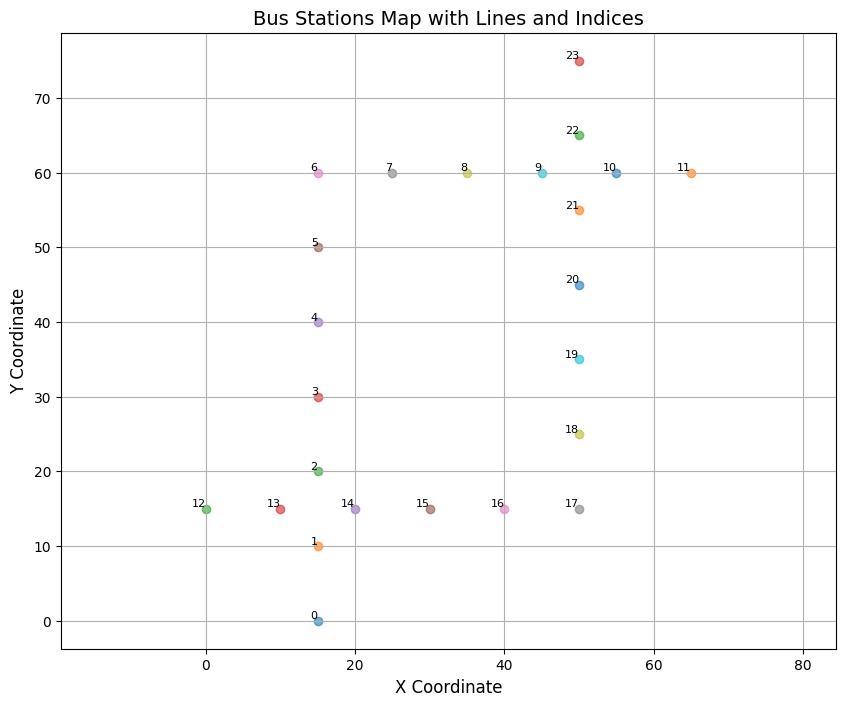

In [13]:
import pandas as pd
import matplotlib.pyplot as plt


# Ensure columns 'x' and 'y' are of float type
bus_stations_df['x'] = bus_stations_df['x'].astype(float)
bus_stations_df['y'] = bus_stations_df['y'].astype(float)

# Plot each bus station, marking its position and labeling with its line and index
plt.figure(figsize=(10, 8))

# Plot all stations
for index, row in bus_stations_df.iterrows():
    plt.scatter(row['x'], row['y'], label=f"{row['line']}" if index == 0 else "", alpha=0.6)
    plt.text(row['x'], row['y'], f"{index}", fontsize=8, ha='right', va='bottom')

# Adding labels and title
plt.title("Bus Stations Map with Lines and Indices", fontsize=14)
plt.xlabel("X Coordinate", fontsize=12)
plt.ylabel("Y Coordinate", fontsize=12)
plt.grid(True)
plt.axis("equal")

# Display the plot
plt.show()

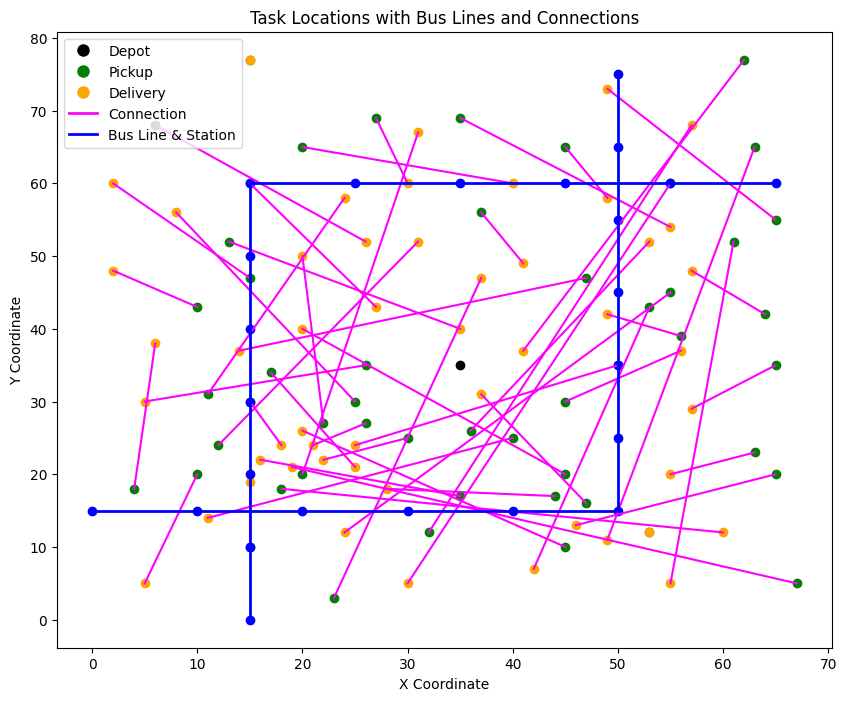

In [14]:
import matplotlib.pyplot as plt

# Existing plot setup for tasks (pickup, delivery, depot)
plt.figure(figsize=(10, 8))

# 遍历每一行，绘制pickup和delivery点及其连接
for _, row in task_df.iterrows():
    task_type = row['TASK TYPE']
    x, y = row['X'], row['Y']
    
    if task_type == 'depot':
        plt.scatter(x, y, color='black')
    elif task_type == 'pickup':
        sibling_index = row['CONNECTION']
        sibling_row = task_df.iloc[sibling_index]
        sibling_x, sibling_y = sibling_row['X'], sibling_row['Y']
        plt.scatter(x, y, color='green')
        plt.scatter(sibling_x, sibling_y, color='orange')
        plt.plot([x, sibling_x], [y, sibling_y], color='magenta')
    elif task_type == 'delivery':
        continue  # Already plotted in 'pickup' part

# Plotting the bus stations and lines
for line in bus_stations_df['line'].unique():
    line_stations = bus_stations_df[bus_stations_df['line'] == line]
    
    # Plot bus stations in red
    plt.scatter(line_stations['x'], line_stations['y'], color='blue', label=f'{line} Bus Station')

    # Draw lines connecting bus stations
    plt.plot(line_stations['x'], line_stations['y'], color='blue', linestyle='-', linewidth=2)

# Adding legends
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=10, label='Depot'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Pickup'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Delivery'),
    plt.Line2D([0], [0], color='magenta', lw=2, label='Connection'),
    plt.Line2D([0], [0], color='blue', lw=2, label='Bus Line & Station')
])

# Set plot title and labels
plt.title('Task Locations with Bus Lines and Connections')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')

# # 保存图表到 'photos/lr210.png'
plt.savefig('photos/lr210.png')

# Display the plot
plt.grid(False)
plt.show()

In [15]:
# 假设 pairs_df 已经包含任务信息，并且具有 'pickup_earliest_time' 列
# 将任务按 'pickup_earliest_time' 从小到大排序
sorted_tasks = pairs_df.sort_values(by='pickup_earliest_time').reset_index(drop=True)

sorted_tasks = sorted_tasks.iloc[:-1]

# 创建一个列表或字典来存储排序后的任务
task_list = []

# 遍历排序后的任务，记录每个任务的索引和任务详情
for index, task in sorted_tasks.iterrows():
    task_record = {
        'index': index,
        # 'package': index,
        'pickup_task': task['pickup_task'],
        'pickup_time': task['pickup_earliest_time'],
        'delivery_task': task['delivery_task'],
        'pickup_x': task['pickup_x'],  # 单独记录 pickup_x
        'pickup_y': task['pickup_y'],  # 单独记录 pickup_y
        'delivery_x': task['delivery_x'],  # 单独记录 delivery_x
        'delivery_y': task['delivery_y'],  # 单独记录 delivery_y
        'distance': task['distance']
    }
    task_list.append(task_record)

task_list
# 输出任务列表
# for task in task_list:
#     print(f"Task {task['index']}: Pickup Task {task['pickup_task']} at {task['pickup_location']} "
#           f"from earliest time {task['pickup_time']}, Deliver to {task['delivery_location']}, "
#           f"Distance: {task['distance']}")

[{'index': 0,
  'pickup_task': 12.0,
  'pickup_time': 15.0,
  'delivery_task': 95.0,
  'pickup_x': 50.0,
  'pickup_y': 35.0,
  'delivery_x': 25.0,
  'delivery_y': 24.0,
  'distance': 27.313000567495326},
 {'index': 1,
  'pickup_task': 2.0,
  'pickup_time': 18.0,
  'delivery_task': 85.0,
  'pickup_x': 35.0,
  'pickup_y': 17.0,
  'delivery_x': 16.0,
  'delivery_y': 22.0,
  'distance': 19.6468827043885},
 {'index': 2,
  'pickup_task': 21.0,
  'pickup_time': 18.0,
  'delivery_task': 18.0,
  'pickup_x': 45.0,
  'pickup_y': 20.0,
  'delivery_x': 20.0,
  'delivery_y': 40.0,
  'distance': 32.01562118716424},
 {'index': 3,
  'pickup_task': 5.0,
  'pickup_time': 20.0,
  'delivery_task': 93.0,
  'pickup_x': 15.0,
  'pickup_y': 30.0,
  'delivery_x': 18.0,
  'delivery_y': 24.0,
  'distance': 6.708203932499369},
 {'index': 4,
  'pickup_task': 72.0,
  'pickup_time': 22.0,
  'delivery_task': 53.0,
  'pickup_x': 47.0,
  'pickup_y': 16.0,
  'delivery_x': 37.0,
  'delivery_y': 31.0,
  'distance': 18.0277

In [16]:
# sorted_tasks

## Bus Dataframe

In [17]:
bus_stations_df

,line,x,y,station_index
0,Line 1,15.0,0.0,0
1,Line 1,15.0,10.0,1
2,Line 1,15.0,20.0,2
3,Line 1,15.0,30.0,3
4,Line 1,15.0,40.0,4
5,Line 1,15.0,50.0,5
6,Line 1,15.0,60.0,6
7,Line 1,25.0,60.0,7
8,Line 1,35.0,60.0,8
9,Line 1,45.0,60.0,9


## Package

In [18]:
import numpy as np
from scipy.spatial.distance import cdist
from collections import deque
import math
# 查找离给定位置最近的巴士站
def find_nearest_bus_station(x, y, bus_stations, line):
    """
    在指定线路上查找离 (x, y) 最近的巴士站。

    参数：
    - x, y: 当前坐标
    - bus_stations: 所有巴士站对象的列表
    - line: 目标线路名称

    返回：
    - 最近的巴士站对象
    """
    # 筛选属于指定线路的巴士站
    filtered_stations = [bs for bs in bus_stations if bs.line == line]
    if not filtered_stations:
        raise ValueError(f"No bus stations found for line {line}.")

    # 使用 cdist 计算距离并找出最近的站点
    distances = cdist([(x, y)], [(bs.x, bs.y) for bs in filtered_stations])
    nearest_index = np.argmin(distances)
    return filtered_stations[nearest_index]

def calculate_best_line(pickup_x, pickup_y, delivery_x, delivery_y, bus_stations, bus_lines):
    def find_station(x, y, stations, line):
        # 筛选属于当前线路的站点
        stations_in_line = [station for station in stations if station.line == line]
        if not stations_in_line:
            return None, float('inf')

        # 查找最近的站点
        min_distance = float('inf')
        nearest_station = None
        for station in stations_in_line:
            distance = ((station.x - x) ** 2 + (station.y - y) ** 2) ** 0.5
            if distance < min_distance:
                min_distance = distance
                nearest_station = station
        return nearest_station, min_distance

    best_line = None
    min_total_distance = float('inf')

    for line in bus_lines:
        # 找到当前线路下，距离取货点最近的站和距离
        pickup_station, pickup_distance = find_station(pickup_x, pickup_y, bus_stations, line)
        # 找到当前线路下，距离送货点最近的站和距离
        delivery_station, delivery_distance = find_station(delivery_x, delivery_y, bus_stations, line)

        # 如果没有符合条件的站点，跳过该线路
        if pickup_station is None or delivery_station is None:
            continue

        # 计算总距离
        total_distance = pickup_distance + delivery_distance

        # 更新最佳线路
        if total_distance < min_total_distance:
            min_total_distance = total_distance
            best_line = line

    return best_line, min_total_distance

# 巴士站类，记录位置
class BusStation:
    def __init__(self, x, y, line):
        self.x = x
        self.y = y
        self.line = line

class Package:
    def __init__(self, package_id, task_id):
        self.package_id = package_id
        self.task_id = task_id  # Store only the task ID
        self.status = 'at_pickup_point'  # Initial status
        self.bus_id = None

    def update_status(self, new_status):
        self.status = new_status
        print(f"[DEBUG] Package {self.package_id} status updated to {self.status}.")
        old_status = self.status
        self.status = new_status
        print(f"Package {self.package_id} status changed: {old_status} -> {new_status}")

# Function to find the corresponding task by ID
def get_task_by_id(task_id):
    return next((task for task in tasks if task['index'] == task_id), None)

# Function to find the corresponding package by ID
def get_package_by_id(package_id):
    return next((package for package in packages if package.package_id == package_id), None)

## Bus

In [42]:


class Bus:
    def __init__(self, bus_id, route, line, start_station_index, direction, speed=2.5, stop_time=3):
        self.bus_id = bus_id
        self.line = line 
        self.route = route
        self.station_index = start_station_index
        self.direction = direction  # 1 表示向前，-1 表示向后
        self.x = self.route[self.station_index]['x']
        self.y = self.route[self.station_index]['y']
        self.speed = speed
        self.time_at_station = 0
        self.stop_time = stop_time
        self.status = 'at_station'  # 初始状态为在站点
        self.capacity = 1  # 每辆巴士的容量限制
        self.current_package = None  # 巴士当前携带的包裹

    def move(self):
        if self.status == 'at_station':
            # 等待时间逻辑
            self.time_at_station += 1
            if self.time_at_station >= self.stop_time:
                self.status = 'moving'
                self.time_at_station = 0
        elif self.status == 'moving':
            next_station_index = self.station_index + self.direction

            # 判断是否到达终点站
            if next_station_index < 0 or next_station_index >= len(self.route):
                # 到达终点站，反转方向
                self.direction *= -1
                next_station_index = self.station_index + self.direction

            # 计算到下一个站点的距离
            next_station = self.route[next_station_index]
            distance_to_next_station = math.sqrt(
                (self.x - next_station['x']) ** 2 + (self.y - next_station['y']) ** 2
            )

            if distance_to_next_station <= self.speed:
                # 到达下一个站点
                self.x = next_station['x']
                self.y = next_station['y']
                self.station_index = next_station_index
                self.status = 'at_station'
            else:
                # 向目标站点移动
                move_ratio = self.speed / distance_to_next_station
                self.x += move_ratio * (next_station['x'] - self.x)
                self.y += move_ratio * (next_station['y'] - self.y)

    def can_pickup_package(self):
        """检查巴士是否可以接收包裹"""
        return self.current_package is None

    def load_package(self, package):
        """加载包裹到巴士"""
        if self.can_pickup_package():
            self.current_package = package
            package.update_status('on_bus')
            print(f"Package {package.package_id} loaded onto Bus {self.bus_id}.")
        else:
            print(f"Bus {self.bus_id} is full, cannot load Package {package.package_id}.")

    def unload_package(self):
        """从巴士卸载包裹"""
        package = self.current_package
        self.current_package = None
        return package
    
    
    def check_direction(self, target_station):
        """
        检查巴士方向是否朝向目标站点。
        参数：
        - target_station: 目标站点坐标 (x, y)
        返回值：
        - True: 如果巴士行进方向最终会到达目标站点
        - False: 如果巴士行进方向不会到达目标站点
        """
        next_station_index = self.station_index + self.direction

        # 检查当前方向是否合法，非法则自动反转方向
        if next_station_index < 0 or next_station_index >= len(self.route):
            return True  # 到达终点自动反方向行驶，目标有可能在新方向上

        # 模拟沿当前方向行驶路径，检查目标站点是否在路径上
        current_index = self.station_index
        while 0 <= current_index < len(self.route):
            # 如果找到目标站点，方向正确
            station = self.route[current_index]
            if (station['x'], station['y']) == target_station:
                return True
            current_index += self.direction

        # 如果未找到目标站点，方向错误
        return False
    
    def is_on_target_line(self, target_line):
        """
        检查巴士是否在目标线路上。
        :param target_line: 目标线路名称
        :return: True 如果巴士属于目标线路，否则 False
        """
        return self.line == target_line


## Bus system

In [43]:
class BusSystem:
    def __init__(self):

        self.tasks_transported = 0  # 统计巴士运输的次数
        self.buses = []  # 公交车列表
        self.bus_id_counter = 0  # 用来给每辆公交车分配唯一ID
        self.time = 0  # 系统的全局时间


    def simulate(self, bus_lines, bus_stations_df):
        """每隔50个时间单位发车一次，并更新公交车的位置"""
        # 每隔50个时间单位添加新的公交车
        if self.time % 10 == 0 and self.time <= 50:
            # print(f"Starting new buses on all lines at time {self.time}.")
            self.initialize_buses(bus_lines, bus_stations_df)

        # 更新所有公交车的位置
        self.update_buses()
        self.time += 0.5  # 时间步长

    def initialize_buses(self, bus_lines, bus_stations_df):
        """初始化每条线路的巴士"""
        for line in bus_lines:
            # 获取并排序线路站点
            route_stations = sorted(
                [station for station in bus_stations_df.to_dict('records') if station['line'] == line],
                key=lambda s: s['station_index']
            )
            # print(f"Initializing buses for {line}: {route_stations}")

            # 确保第一个和最后一个站点被正确初始化
            # 初始化巴士
            if len(route_stations) > 1:
                # 在第一站生成一个向前行驶的巴士
                self.buses.append(Bus(
                    bus_id=self.bus_id_counter,
                    line=line,   # <-- 必须加上
                    route=route_stations,
                    start_station_index=0,
                    direction=1
                ))
                self.bus_id_counter += 1

                # 最后一站生成一个向后行驶的巴士
                self.buses.append(Bus(
                    bus_id=self.bus_id_counter,
                    line=line,   # <-- 必须加上
                    route=route_stations,
                    start_station_index=len(route_stations) - 1,
                    direction=-1
                ))
                self.bus_id_counter += 1


    def update_buses(self):
        """更新所有公交车的位置"""
        for bus in self.buses:
            bus.move()
            # print(f"Bus {bus.bus_id} at ({bus.x}, {bus.y}), Status: {bus.status}, Direction: {bus.direction}")

    
    def check_buses_at_station_for_pickup(self, x, y, line=None, delivery_station=None):
        """
        检查指定位置是否有公交车可以用于取包裹，并确保方向正确。
        如果提供了线路信息，则只检查属于该线路的公交车。
        
        参数:
        - x, y: 公交站的坐标（取货站点，或无人机正等车的站点）
        - line: 可选，指定线路名称
        - delivery_station: 目标送货站点 (x, y)
        
        返回:
        - 匹配的公交车对象，如果没有找到返回 None
        """
        for bus in self.buses:
            if bus.x == x and bus.y == y:
                # 如果提供了线路信息，先检查巴士是否在目标线路上
                if line is not None and not bus.is_on_target_line(line):
                    continue
                
                # 如果给定了目标送货站点，需要检查巴士方向
                if delivery_station is not None:
                    if not bus.check_direction(delivery_station):
                        continue
                
                # 如果通过以上检查，返回这辆巴士
                return bus
        
        return None

    def check_buses_at_station_for_delivery(self, x, y, bus_id):
        for bus in self.buses:
            if bus.x == x and bus.y == y and bus.bus_id == bus_id:
                return bus
        return None

## Drone

In [44]:

# 无人机类，负责区域内的取货和将物品送至巴士站
class Drone:
    def __init__(self, drone_id, region, x, y, speed = 5):
        self.drone_id = drone_id
        self.region = region  # 无人机负责的区域编号
        self.x = x
        self.y = y
        self.status = 'idle'  # 初始状态为空闲
        self.current_task = None  # 当前任务
        self.target_x = None
        self.target_y = None
        self.time_until_idle = 0  # 剩余时间
        self.delivery_tasks_completed = 0  # 统计无人机完成的送货任务数
        self.pickup_tasks_completed = 0  # 统计无人机完成的取货任务数
        self.bus_id = None  # 记录携带任务包裹的巴士ID
        self.speed = speed


    def assign_pickup_task(self, task, target_x, target_y, line):
        """分配取货任务，并设置目标位置"""
        self.current_task = task
        self.status = 'moving_to_pickup'
        self.target_x = target_x
        self.target_y = target_y
        self.current_task['line'] = line  # 确保任务携带线路信息

        # 计算欧拉距离并考虑速度
        distance_to_target = np.sqrt((self.target_x - self.x)**2 + (self.target_y - self.y)**2)
        self.time_until_idle = int(np.ceil(distance_to_target / self.speed))

    def assign_delivery_task(self, task, target_x, target_y, line):
        """分配送货任务，设置目标位置为离送货点最近的巴士站"""
        self.current_task = task
        self.status = 'moving_to_bus_station_for_delivery'
        self.target_x = target_x
        self.target_y = target_y
        self.current_task['line'] = line  # 确保任务携带线路信息

        # 计算欧拉距离并考虑速度
        distance_to_target = np.sqrt((self.target_x - self.x)**2 + (self.target_y - self.y)**2)
        self.time_until_idle = int(np.ceil(distance_to_target / self.speed))


    def assign_direct_transport(self, task, pickup_x, pickup_y, delivery_x, delivery_y):
        """分配直接运输任务。"""
        self.current_task = task
        self.status = 'direct_transport_to_pickup'
        self.target_x = pickup_x
        self.target_y = pickup_y

        # 计算到达取货点的距离
        distance_to_pickup = math.sqrt((self.x - pickup_x)**2 + (self.y - pickup_y)**2)
        self.time_until_idle = int(math.ceil(distance_to_pickup / self.speed))

        # 存储送货点坐标到任务中
        self.current_task['delivery_x'] = delivery_x
        self.current_task['delivery_y'] = delivery_y
        print(f"Drone {self.drone_id} assigned direct transport from ({pickup_x}, {pickup_y}) to ({delivery_x}, {delivery_y}).")

    def move(self):
        """Drone's movement logic to fly directly towards the target using Euclidean distance."""
        if self.status == 'idle' or self.time_until_idle <= 0:
            return

        # Calculate Euclidean distance to target
        distance_to_target = np.sqrt((self.target_x - self.x)**2 + (self.target_y - self.y)**2)
        
        if distance_to_target <= self.speed:
            # Move directly to target if within one speed unit
            self.x = self.target_x
            self.y = self.target_y
        else:
            # Move proportionally towards the target based on speed
            move_ratio = self.speed / distance_to_target
            self.x += move_ratio * (self.target_x - self.x)
            self.y += move_ratio * (self.target_y - self.y)

        # Decrement time_until_idle each move
        self.time_until_idle = max(self.time_until_idle - 1, 0)

        # Check if drone has arrived at target
        if self.x == self.target_x and self.y == self.target_y:

            if self.status == 'moving_to_pickup':
                # Check if the pickup point is at a bus station
                package = get_package_by_id(self.current_task['package_id'])
                if package:
                    package.update_status('on_pickup_drone')
                    
                nearest_bus_station = find_nearest_bus_station(self.current_task['pickup_x'], self.current_task['pickup_y'], bus_stations, self.current_task['line'])
                if (self.current_task['pickup_x'] == nearest_bus_station.x and 
                    self.current_task['pickup_y'] == nearest_bus_station.y):
                    # If pickup point is at the bus station, go directly to waiting for bus
                    self.status = 'waiting_at_bus_station_for_pickup_bus'
                    self.current_task['pickup_status'] = 'waiting_for_bus'

                    # print(f"Drone {self.drone_id} is now waiting at the bus station ({self.x}, {self.y}) for the pickup bus.")
                else:
                    # Move to nearest bus station after pickup
                    self.status = 'moving_to_bus_station_finish_pickup'
                    self.target_x, self.target_y = nearest_bus_station.x, nearest_bus_station.y
                    distance_to_target = np.sqrt((self.target_x - self.x)**2 + (self.target_y - self.y)**2)
                    self.time_until_idle = int(np.ceil(distance_to_target / self.speed))
                    # print(f"Drone {self.drone_id} has picked up the package and is heading to the bus station ({self.target_x}, {self.target_y}).")


                # Arrived at bus station after pickup, set status to waiting
            elif self.status == 'moving_to_bus_station_finish_pickup':
                # 检查最近的取货点是否也是送货点
                nearest_pickup_bus_station = find_nearest_bus_station(self.current_task['pickup_x'], self.current_task['pickup_y'], bus_stations, self.current_task['line'])
                if (self.current_task['delivery_x'] == nearest_pickup_bus_station.x and 
                    self.current_task['delivery_y'] == nearest_pickup_bus_station.y):
                    # 如果取货点和送货点是同一个站点，则直接完成送货任务
                    self.status = 'idle'
                    self.delivery_tasks_completed += 1
                    self.current_task['pickup_status'] = 'completed'
                    self.current_task['delivery_status'] = 'completed'
                    if 'package_id' in self.current_task and self.current_task['package_id'] is not None:
                        package = get_package_by_id(self.current_task['package_id'])
                        if package is not None:
                            package.update_status('delivered')
                            print(f"Package {package.package_id} has been delivered directly at the pickup point.")
                        else:
                            print(f"错误: 未找到 package_id 为 {self.current_task['package_id']} 的包裹。")

                    # 清除当前任务
                    self.current_task = None
                    self.target_x = None
                    self.target_y = None
                else:
                    # 否则，设置状态为等待巴士接取
                    self.status = 'waiting_at_bus_station_for_pickup_bus'
                    self.current_task['pickup_status'] = 'waiting_for_bus'
                    print(f"Drone {self.drone_id} is now waiting at the bus station ({self.x}, {self.y}) for the pickup bus.")

            elif self.status == 'moving_to_bus_station_for_delivery':
                # Check if the delivery point is at a bus station
                nearest_bus_station = find_nearest_bus_station(self.current_task['delivery_x'], self.current_task['delivery_y'], bus_stations, self.current_task['line'])
                if (self.current_task['delivery_x'] == nearest_bus_station.x and 
                    self.current_task['delivery_y'] == nearest_bus_station.y):
                    # If delivery point is at the bus station, go directly to idle
                    self.status = 'idle'
                    self.delivery_tasks_completed += 1
                    self.current_task['delivery_status'] = 'completed'
                    if 'package_id' in self.current_task and self.current_task['package_id'] is not None:
                        package = get_package_by_id(self.current_task['package_id'])
                        if package:
                            package.update_status('delivered')
                            print(f"Package {package.package_id} has been delivered.")
                        else:
                            print(f"错误: 未找到 package_id 为 {self.current_task['package_id']} 的包裹。")

                    self.current_task = None
                    self.target_x = None
                    self.target_y = None
                else:
                    # Reached delivery bus station, set waiting status
                    self.current_task['delivery_status'] = 'waiting_for_bus'
                    self.status = 'waiting_at_bus_station_for_delivery'
                    # print(f"Drone {self.drone_id} is now waiting at the bus station ({self.x}, {self.y}) for the delivery.")

            elif self.status == 'waiting_at_bus_station_for_pickup_bus':
                # Waiting at bus station for package arrival
                pass

            elif self.status == 'waiting_at_bus_station_for_delivery':
                # Waiting at bus station for package arrival
                pass

            elif self.status == 'moving_to_delivery':
                # Reached final destination
                self.status = 'idle'
                self.delivery_tasks_completed += 1
                self.current_task['delivery_status'] = 'completed'
                if 'package_id' in self.current_task and self.current_task['package_id'] is not None:
                    package = get_package_by_id(self.current_task['package_id'])
                    if package:
                        package.update_status('delivered')
                        print(f"Package {package.package_id} has been delivered.")
                    else:
                        print(f"错误: 未找到 package_id 为 {self.current_task['package_id']} 的包裹。")

                self.current_task = None
                self.target_x = None
                self.target_y = None
                
            elif self.status == 'direct_transport_to_pickup':
                if self.x == self.target_x and self.y == self.target_y:
                    # 更改状态为直接运输到送货点
                    self.status = 'direct_transport_to_delivery'
                    self.target_x = self.current_task['delivery_x']
                    self.target_y = self.current_task['delivery_y']
                    
                    # 计算到送货点的距离并更新time_until_idle
                    distance_to_delivery = math.sqrt(
                        (self.x - self.target_x)**2 + 
                        (self.y - self.target_y)**2
                    )
                    self.time_until_idle = int(math.ceil(distance_to_delivery / self.speed))
                    
                    # 更新包裹状态
                    if 'package_id' in self.current_task and self.current_task['package_id'] is not None:
                        package = get_package_by_id(self.current_task['package_id'])
                        if package:
                            package.update_status('on_direct_drone')
                            print(f"Package {package.package_id} picked up for direct transport by Drone {self.drone_id}")


            elif self.status == 'direct_transport_to_delivery':
                # 无人机到达直接运输的送货点
                if self.x == self.target_x and self.y == self.target_y:
                    # 完成直接运输任务
                    self.status = 'idle'
                    self.delivery_tasks_completed += 1
                    self.pickup_tasks_completed += 1
                    self.current_task['pickup_status'] = 'completed'
                    self.current_task['delivery_status'] = 'completed'

                    if 'package_id' in self.current_task and self.current_task['package_id'] is not None:
                        package = get_package_by_id(self.current_task['package_id'])
                        if package:
                            package.update_status('directly_delivered')
                            print(f"Package {package.package_id} delivered directly by Drone {self.drone_id}.")

                    # 清除当前任务
                    self.current_task = None
                    self.target_x = None
                    self.target_y = None
                    print(f"Drone {self.drone_id} is now idle after completing direct transport.")



            elif self.status == 'direct_transport_to_delivery':
                # 无人机到达直接运输的送货点
                if self.x == self.target_x and self.y == self.target_y:
                    # 完成直接运输任务
                    self.status = 'idle'
                    self.delivery_tasks_completed += 1
                    self.pickup_tasks_completed += 1
                    self.current_task['pickup_status'] = 'completed'
                    self.current_task['delivery_status'] = 'completed'

                    if 'package_id' in self.current_task and self.current_task['package_id'] is not None:
                        package = get_package_by_id(self.current_task['package_id'])
                        if package:
                            package.update_status('directly_delivered')
                            print(f"Package {package.package_id} delivered directly by Drone {self.drone_id}.")

                    # 清除当前任务
                    self.current_task = None
                    self.target_x = None
                    self.target_y = None
                    print(f"Drone {self.drone_id} is now idle after completing direct transport.")


## Drone Fleet

In [45]:
class DroneFleet:
    def __init__(self, initial_drone_count=1):
        self.drones = [Drone(i, 'pickup', 35, 35) for i in range(initial_drone_count)]
        self.drone_count = initial_drone_count
        self.pickup_task_queue = deque()
        self.delivery_task_queue = deque()
                # 新增的直接运输队列
        self.direct_task_queue = deque()

    def get_idle_drone(self, target_x, target_y):
        """查找距离目标位置最近的空闲无人机"""
        nearest_drone = None
        min_distance = float('inf')
        
        for drone in self.drones:
            if drone.status == 'idle':
                distance = self.calculate_distance(drone, target_x, target_y)
                if distance < min_distance:
                    min_distance = distance
                    nearest_drone = drone

        return nearest_drone

    def create_new_drone(self):
        """创建一个新的无人机并返回它"""
        new_drone = Drone(self.drone_count, 'pickup', 35, 35)  # 假设新无人机从(35,35)出发
        self.drones.append(new_drone)
        self.drone_count += 1
        print(f"Created new drone with ID {new_drone.drone_id}.")
        return new_drone

    def ensure_delivery_drone_availability(self, task, target_x, target_y):
        """
        如果没有空闲的无人机可用，创建一个新的无人机来处理任务。
        """
        # 创建一个新的无人机
        new_drone = self.create_new_drone()
        # 找到最近的巴士站，并分配送货任务
        nearest_station = find_nearest_bus_station(target_x, target_y, bus_stations, task['line'] )
        new_drone.assign_delivery_task(task, nearest_station.x, nearest_station.y, task['line'] )
        # print(f"No available drones. Created new Drone {new_drone.drone_id} and assigned delivery task {task['pickup_task']} at nearest bus station ({nearest_station.x}, {nearest_station.y})")

    def calculate_distance(self, drone, x, y):
        """计算无人机与目标点之间的欧式距离"""
        return ((drone.x - x) ** 2 + (drone.y - y) ** 2) ** 0.5


    def try_allocate_direct_transport(self, task, pickup_x, pickup_y, delivery_x, delivery_y):
        """直接分配无人机从取货点送到送货点。"""
        nearest_drone = self.get_idle_drone(pickup_x, pickup_y)

        if nearest_drone is None:
            print(f"No idle drone available for direct transport task {task['pickup_task']}")
            return False

        # 分配直接运输任务
        nearest_drone.assign_direct_transport(task, pickup_x, pickup_y, delivery_x, delivery_y)
        task['pickup_status'] = 'assigned'
        task['delivery_status'] = 'assigned'

        if 'package_id' in task and task['package_id'] is not None:
            package = get_package_by_id(task['package_id'])
            if package:
                package.update_status('on_pickup_drone')
                print(f"Package {package.package_id} assigned for direct transport by Drone {nearest_drone.drone_id}")

        print(f"Successfully assigned direct transport task {task['pickup_task']} to Drone {nearest_drone.drone_id}")
        print(f"From: ({pickup_x}, {pickup_y}) To: ({delivery_x}, {delivery_y})")
        return True


    def try_allocate_delivery_task(self, task, target_x, target_y, auto_create_drone=True):
        """尝试分配送货任务。
        如果成功分配无人机，返回 True；如果失败，返回 False。
        """
        nearest_station = find_nearest_bus_station(target_x, target_y, bus_stations, task['line'])
        nearest_drone = self.get_idle_drone(nearest_station.x, nearest_station.y)

        # 检查是否找到了空闲无人机
        if nearest_drone is None:
            if auto_create_drone:
                # 如果允许自动创建无人机，确保有足够的无人机来处理任务
                self.ensure_delivery_drone_availability(task, target_x, target_y)
                return True
            else:
                # 没有可用无人机且不允许创建新无人机
                print(f"No available drone for delivery task {task['pickup_task']}.")
                return False

        # 如果送货点位于巴士站，则直接标记任务完成
        if nearest_station.x == target_x and nearest_station.y == target_y:
            task['delivery_status'] = 'completed'
            nearest_drone.delivery_tasks_completed += 1
            print(f"Delivery task {task['pickup_task']} completed directly at the bus station ({target_x}, {target_y}).")
            return True

        # 分配送货任务到无人机
        nearest_drone.assign_delivery_task(task, nearest_station.x, nearest_station.y, task['line'])
        task['delivery_status'] = 'assigned'
        print(f"Assigned delivery task {task['pickup_task']} to Drone {nearest_drone.drone_id} at nearest bus station ({nearest_station.x}, {nearest_station.y}).")
        return True

    def add_delivery_task_to_queue(self, task, target_x, target_y):
        """将送货任务加入等待队列。"""
        self.delivery_task_queue.append((task, target_x, target_y))
        print(f"Delivery task {task['pickup_task']} added to the queue.")



    def try_allocate_pickup_task(self, task, target_x, target_y):
        """尝试分配取货任务。
        如果成功分配无人机，返回 True；如果失败，返回 False。
        """









        nearest_station = find_nearest_bus_station(target_x, target_y, bus_stations, task['line'])
        nearest_drone = self.get_idle_drone(target_x, target_y)

        # 检查是否找到空闲无人机
        if nearest_drone is None:
            # print(f"No available drone for pickup task {task['pickup_task']}.")
            return False

        # 分配取货任务到无人机
        nearest_drone.assign_pickup_task(task, target_x, target_y, task['line'])
        task['pickup_status'] = 'assigned'

        if 'package_id' in task and task['package_id'] is not None:
            package = get_package_by_id(task['package_id'])  # 根据 ID 查找包裹对象
            if package:
                package.update_status('on_pickup_drone')  # 更新状态为无人机正在取货

        print(f"Assigned pickup task {task['pickup_task']} to Drone {nearest_drone.drone_id} at ({target_x}, {target_y}).")
        return True


    def add_pickup_task_to_queue(self, task, target_x, target_y):
        """将取货任务加入等待队列。"""
        self.pickup_task_queue.append((task, target_x, target_y))
        print(f"Pickup task {task['pickup_task']} added to the queue.")



        # # 从取货任务队列中移除已分配的任务（确保是正确的任务）
        # if (task, target_x, target_y) in self.pickup_task_queue:
        #     self.pickup_task_queue.remove((task, target_x, target_y))
        #     print(f"Removed task {task['pickup_task']} from the queue.")

    def process_pickup_task_queue(self):
        """
        重新尝试分配等待队列中的取货任务。
        """
        for task, target_x, target_y in list(self.pickup_task_queue):  # 遍历等待队列
            success = self.try_allocate_pickup_task(task, target_x, target_y)

            # 如果成功分配，移除出队列
            if success:
                self.pickup_task_queue.remove((task, target_x, target_y))
                print(f"Reassigned pickup task {task['pickup_task']} successfully.")

    def add_direct_task_to_queue(self, task, pickup_x, pickup_y, delivery_x, delivery_y):
        """
        将直接运输任务加入等待队列。
        """
        self.direct_task_queue.append((task, pickup_x, pickup_y, delivery_x, delivery_y))
        print(f"Direct transport task {task['pickup_task']} added to the direct queue.")

    def process_direct_task_queue(self):
        """
        重新尝试分配等待队列中的直接运输任务。
        """
        # 用 list(...) 遍历拷贝，可以在循环中安全地修改原队列
        for (task, pickup_x, pickup_y, delivery_x, delivery_y) in list(self.direct_task_queue):
            success = self.try_allocate_direct_transport(
                task, 
                pickup_x, 
                pickup_y, 
                delivery_x, 
                delivery_y
            )
            # 如果成功分配，移除出队列
            if success:
                self.direct_task_queue.remove((task, pickup_x, pickup_y, delivery_x, delivery_y))
                print(f"Reassigned direct transport task {task['pickup_task']} successfully.")

    def process_delivery_task_queue(self):
        """
        重新尝试分配等待队列中的送货任务。
        """
        # 用 list(...) 遍历拷贝，可以在循环中安全地修改原队列
        for (task, delivery_x, delivery_y) in list(self.delivery_task_queue):
            success = self.try_allocate_delivery(
                task,
                delivery_x,
                delivery_y
            )
            # 如果成功分配，移除出队列
            if success:
                self.delivery_task_queue.remove((task, delivery_x, delivery_y))
                print(f"Reassigned delivery task {task['delivery_task']} successfully.")

    def get_pickup_queue(self):
        """Return the pickup task queue."""
        return list(self.pickup_task_queue)

    def get_delivery_queue(self):
        """Return the delivery task queue."""
        return list(self.delivery_task_queue)

    def move_all_drones(self):
        for drone in self.drones:
            drone.move()

            # 如果无人机空闲，优先处理送货任务
            # if drone.status == 'idle' and self.delivery_task_queue:
            #     task, target_x, target_y = self.delivery_task_queue.popleft()
            #     print(f"Assigning queued delivery task {task['pickup_task']} to Drone {drone.drone_id} at ({target_x}, {target_y})")
            #     drone.assign_delivery_task(task, target_x, target_y)

            if drone.status == 'idle' and self.delivery_task_queue:
                print("Current delivery_task_queue:")
                for task, x, y in self.delivery_task_queue:
                    print(f"Task {task['pickup_task']} - Delivery: {task['delivery_status']} at ({x}, {y})")
                task, target_x, target_y = self.delivery_task_queue.popleft()
                print(f"Assigning queued delivery task {task['pickup_task']} to Drone {drone.drone_id}")
                drone.assign_delivery_task(task, target_x, target_y)

            # 如果无人机空闲，且没有送货任务，则处理取货任务
            elif drone.status == 'idle' and self.pickup_task_queue:
                task, target_x, target_y = self.pickup_task_queue.popleft()
                print(f"Assigning queued pickup task {task['pickup_task']} to Drone {drone.drone_id} at ({target_x}, {target_y})")
                drone.assign_pickup_task(task, target_x, target_y, task['line'] )



In [46]:
def is_bus_on_line(bus, line):
    """
    判断公交车是否属于指定线路。
    """
    return any(station['line'] == line for station in bus.route)

def calculate_transport_distance(pickup_x, pickup_y, delivery_x, delivery_y, bus_stations, bus_lines):
    """
    计算使用巴士运输和直接用无人机运输的总路程。

    返回：
    - bus_distance: 使用巴士运输的总路程
    - drone_distance: 直接用无人机运输的总路程
    """
    # 直接运输的距离
    drone_distance = math.sqrt((pickup_x - delivery_x)**2 + (pickup_y - delivery_y)**2)

    # 计算使用巴士运输的距离
    bus_distance = float('inf')
    for line in bus_lines:
        # 用欧式距离计算取货点到最近取货站的距离
        pickup_station = find_nearest_bus_station(pickup_x, pickup_y, bus_stations, line)
        if pickup_station:
            pickup_distance = math.sqrt((pickup_x - pickup_station.x)**2 + (pickup_y - pickup_station.y)**2)
        else:
            pickup_distance = float('inf')

        # 用欧式距离计算送货站到送货点的距离
        delivery_station = find_nearest_bus_station(delivery_x, delivery_y, bus_stations, line)
        if delivery_station:
            delivery_distance = math.sqrt((delivery_x - delivery_station.x)**2 + (delivery_y - delivery_station.y)**2)
        else:
            delivery_distance = float('inf')

        # 综合距离：这里仅示例为「取货点 -> 取货站」+「送货站 -> 送货点」
        # 如果你还要考虑巴士在线路上跑的距离，则需要进一步加上站与站之间的乘车距离
        if pickup_station and delivery_station:
            current_bus_distance = pickup_distance + delivery_distance
            bus_distance = min(bus_distance, current_bus_distance)

    return bus_distance, drone_distance


In [47]:
def calculate_distance(x1, y1, x2, y2):
    """
    计算两点之间的欧几里得距离。
    参数:
    - x1, y1: 第一个点的坐标
    - x2, y2: 第二个点的坐标
    返回:
    - 两点之间的距离
    """
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

## Main

In [48]:
tolerance = 10
# 初始化统计信息
task_statistics = []
# 存储每个时间步的记录
simulation_records = []
bus_records = []
package_records = []
# 读取巴士站的x和y坐标并初始化巴士站
bus_stations = [
    BusStation(row['x'], row['y'], row['line'])  # 假设 bus_stations_df 中有 'line' 列
    for index, row in bus_stations_df.iterrows()
]
# 初始化模拟
drone_fleet = DroneFleet()
bus_lines = ['Line 1', 'Line 2']

bus_system = BusSystem()
bus_system.simulate(bus_lines, bus_stations_df)

# 初始化任务状态
tasks = task_list
packages = []

for task in tasks:
    task['pickup_status'] = 'unassigned'
    task['delivery_status'] = 'unassigned'
    # 使用任务的index作为包裹ID
    package = Package(task['index'], task['index'])  # 第一个参数是package_id，第二个是task_id
    packages.append(package)
    task['package_id'] = task['index']  # 将包裹ID设为任务索引

# 打印包裹和任务对应信息以调试
print(f"All packages created: {len(packages)}")
for package in packages:
    print(f"Package ID: {package.package_id}, Task ID: {package.task_id}")

# 打印包裹和任务对应信息以调试
print(f"All packages created: {len(packages)}")
# for package in packages:
#     print(f"Package ID: {package.package_id}, Task ID: {package.task_id}")

total_time = 1000
current_time = 0
task_index = 0

package_id_counter = 0

# 计算巴士站的位置到编号的映射
station_mapping = {(station.x, station.y): idx for idx, station in enumerate(bus_stations)}


while current_time <= total_time:
    bus_system.simulate(bus_lines, bus_stations_df)


    # 定期检查并处理等待队列中的任务
    drone_fleet.process_delivery_task_queue()
    drone_fleet.process_pickup_task_queue()
    drone_fleet.process_direct_task_queue()
    while task_index < len(tasks) and tasks[task_index]['pickup_time'] <= current_time:
        task = tasks[task_index]
        if task['pickup_status'] == 'unassigned':
            #
            # 计算运输距离
            bus_distance, drone_distance = calculate_transport_distance(
                task['pickup_x'], task['pickup_y'], task['delivery_x'], task['delivery_y'],
                bus_stations, bus_lines
            )

            # 选择运输方式
            if drone_distance - tolerance < bus_distance:
                # 直接用无人机运输
                success_pickup = drone_fleet.try_allocate_direct_transport(task, task['pickup_x'], task['pickup_y'], task['delivery_x'], task['delivery_y'])
                if not success_pickup:
                    drone_fleet.add_direct_task_to_queue(task, task['pickup_x'], task['pickup_y'],task['delivery_x'], task['delivery_y'],)
            else:
                # 使用巴士运输（原有逻辑）
                best_line, min_distance = calculate_best_line(
                    task['pickup_x'], task['pickup_y'], task['delivery_x'], task['delivery_y'], 
                    bus_stations, bus_lines
                )
                task['line'] = best_line

                success_pickup = drone_fleet.try_allocate_pickup_task(task, task['pickup_x'], task['pickup_y'])
                if not success_pickup:
                    drone_fleet.add_pickup_task_to_queue(task, task['pickup_x'], task['pickup_y'])

                success_delivery = drone_fleet.try_allocate_delivery_task(task, task['delivery_x'], task['delivery_y'], auto_create_drone=True)
                if not success_delivery:
                    drone_fleet.add_delivery_task_to_queue(task, task['delivery_x'], task['delivery_y'])
                
                # 记录取货时间，用于延迟分配送货任务
                # task['pickup_assignment_time'] = current_time

        task_index += 1


    drone_fleet.move_all_drones()
    bus_system.simulate(bus_lines, bus_stations_df)


    


    # 记录每个 package 的当前状态和位置
    # 更新包裹状态并记录
    for package in packages:
        task = get_task_by_id(package.task_id)  # Find the associated task
        if package.status == 'at_pickup_point':
            x, y = task['pickup_x'], task['pickup_y']
        elif package.status == 'on_pickup_drone':
            drone = next((drone for drone in drone_fleet.drones if drone.current_task and drone.current_task['package_id'] == package.package_id), None)
            x, y = (drone.x, drone.y) if drone else (None, None)
        elif package.status == 'on_bus':
            bus = next((bus for bus in bus_system.buses if bus.current_package == package), None) # 遍历 bus_system.buses 中的所有公交车，查找当前携带该包裹 (package.package_id) 的公交车。
            x, y = (bus.x, bus.y) if bus else (None, None)
        elif package.status == 'on_delivery_drone':
            drone = next((drone for drone in drone_fleet.drones if drone.current_task and drone.current_task['package_id'] == package.package_id), None)
            x, y = (drone.x, drone.y) if drone else (None, None)
        elif package.status == 'delivered':
            x, y = task['delivery_x'], task['delivery_y']
        elif package.status == 'on_direct_drone':
            drone = next((drone for drone in drone_fleet.drones if drone.current_task and drone.current_task['package_id'] == package.package_id), None)
            x, y = (drone.x, drone.y) if drone else (None, None)
        elif package.status == 'directly_delivered':
            x, y = task['delivery_x'], task['delivery_y']

        # 记录包裹状态
        package_records.append({
            "time": current_time,
            "package_id": package.package_id,
            "task_id": package.task_id,
            "status": package.status,
            "x": x,
            "y": y
        })
    # 在主循环中打印队列
    # print(f"Time {current_time}: Delivery Task Queue")
    # for task in drone_fleet.delivery_task_queue:
    #     print(f"Task {task['pickup_task']} - Pickup: {task['pickup_status']}, Delivery: {task['delivery_status']}")

    for drone in drone_fleet.drones:
        simulation_records.append({
            "time": current_time,
            "entity": "drone",
            "id": drone.drone_id,
            "x": drone.x,
            "y": drone.y,
            "status": drone.status
        })

    for bus in bus_system.buses:
        simulation_records.append({
            "time": current_time,
            "entity": "bus",
            "id": bus.bus_id,
            "x": bus.x,
            "y": bus.y,
            "status": bus.status,
            "direction": bus.direction
        })

    for bus in bus_system.buses:
        # 获取当前站点编号
        current_station = station_mapping.get((bus.x, bus.y), None)
        if current_station is not None:
            # 获取对应的 station_index 和线路信息
            station_index = next(
                (station['station_index'] for station in bus.route if station['x'] == bus.x and station['y'] == bus.y),
                None
            )
            line = bus.route[0]['line'] if bus.route else None  # 假设所有站点的 line 一致

            # 记录数据
            bus_records.append({
                "time": current_time,
                "entity": "bus",
                "id": bus.bus_id,
                "station": current_station,       # 站点名称或编号
                "station_index": station_index,  # 站点索引
                "line": line,                    # 所属线路
                "has_package": bus.current_package is not None  # 判断是否携带包裹
            })


    for drone in drone_fleet.drones:
        if (
            drone.status == 'waiting_at_bus_station_for_pickup_bus' and 
            drone.current_task is not None and 
            drone.current_task['pickup_status'] == 'waiting_for_bus'
        ):
            # 确定当前任务所在的线路
            current_line = drone.current_task['line']
            print(drone.current_task['package_id'])
            # print(current_line+'芜湖起飞')

            
            # 检查当前位置是否为两条线路的交界处
            intersecting_lines = [
                line for line in bus_lines
                if any(station for station in bus_stations if station.line == line and station.x == drone.x and station.y == drone.y)
            ]
            
            # 如果是交界处，确保无人机在等当前线路的大巴
            if len(intersecting_lines) > 1 and current_line not in intersecting_lines:
                print(f"Error: Drone {drone.drone_id} is at an intersection but not waiting for the correct line.")
                continue
            
            nearest_delivery_station = find_nearest_bus_station(
                drone.current_task['delivery_x'], 
                drone.current_task['delivery_y'], 
                bus_stations, 
                current_line
            )

            bus = bus_system.check_buses_at_station_for_pickup(
                drone.x, 
                drone.y, 
                line=current_line, 
                delivery_station=(nearest_delivery_station.x, nearest_delivery_station.y)
)
            
            if bus and bus.can_pickup_package():
                package = get_package_by_id(drone.current_task['package_id'])
                bus.load_package(package)
                package.bus_id = bus.bus_id  # Associate the package with the bus
                package.update_status('on_bus')
                drone.current_task['pickup_status'] = 'completed'
                drone.current_task = None
                drone.status = 'idle'
                drone.pickup_tasks_completed += 1
                # if package.package_id == 11:
                #     print(f"芜湖起飞Debug Package 11: Time {current_time}, Status: {package.status}, Bus: {package.bus_id}")
                #     print(f"不会吧 这也不显示吗Package 11 is assigned to line: {task['line']}")
            

        elif drone.status == 'waiting_at_bus_station_for_delivery':
            # Modify this line to use the correct function
            package = get_package_by_id(drone.current_task['package_id'])  # Ensure package is retrieved first
            bus = bus_system.check_buses_at_station_for_delivery(drone.x, drone.y, package.bus_id)

            if package.package_id == 11:
                print(f"Debug Package 11: Time {current_time}, Status: {package.status}, Bus: {package.bus_id}")
            
            if bus and bus.current_package:
                package = bus.unload_package()
                # print(f"Unloaded package ID: {package.package_id} 哈哈哈哈哈哈")  # 调试输出

                package.update_status('on_delivery_drone')
                task = get_task_by_id(package.task_id)
                if task is not None:
                    drone.assign_delivery_task(task, task['delivery_x'], task['delivery_y'],task['line'] )
                    drone.status = 'moving_to_delivery'
                else:
                    print(f"错误: 未找到 package_id 为 {package.package_id} 的任务")
            # else:
            #     print(f"错误: 未找到 package_id 为 {package.package_id} 的包裹或对应的巴士")

    current_time += 1

print("Simulation complete. Task and drone summary:")
total_delivery_tasks = 0
total_pickup_tasks = 0

for drone in drone_fleet.drones:
    print(f"Drone {drone.drone_id}: Completed {drone.delivery_tasks_completed} delivery tasks, and {drone.pickup_tasks_completed} pickup tasks.")
    total_delivery_tasks += drone.delivery_tasks_completed
    total_pickup_tasks += drone.pickup_tasks_completed

print(f"Total completed tasks: {total_delivery_tasks + total_pickup_tasks} (Delivery: {total_delivery_tasks}, Pickup: {total_pickup_tasks})")

simulation_df = pd.DataFrame(simulation_records)
bus_simulation_df = pd.DataFrame(bus_records)
package_simulation_df = pd.DataFrame(package_records)



All packages created: 48
Package ID: 0, Task ID: 0
Package ID: 1, Task ID: 1
Package ID: 2, Task ID: 2
Package ID: 3, Task ID: 3
Package ID: 4, Task ID: 4
Package ID: 5, Task ID: 5
Package ID: 6, Task ID: 6
Package ID: 7, Task ID: 7
Package ID: 8, Task ID: 8
Package ID: 9, Task ID: 9
Package ID: 10, Task ID: 10
Package ID: 11, Task ID: 11
Package ID: 12, Task ID: 12
Package ID: 13, Task ID: 13
Package ID: 14, Task ID: 14
Package ID: 15, Task ID: 15
Package ID: 16, Task ID: 16
Package ID: 17, Task ID: 17
Package ID: 18, Task ID: 18
Package ID: 19, Task ID: 19
Package ID: 20, Task ID: 20
Package ID: 21, Task ID: 21
Package ID: 22, Task ID: 22
Package ID: 23, Task ID: 23
Package ID: 24, Task ID: 24
Package ID: 25, Task ID: 25
Package ID: 26, Task ID: 26
Package ID: 27, Task ID: 27
Package ID: 28, Task ID: 28
Package ID: 29, Task ID: 29
Package ID: 30, Task ID: 30
Package ID: 31, Task ID: 31
Package ID: 32, Task ID: 32
Package ID: 33, Task ID: 33
Package ID: 34, Task ID: 34
Package ID: 35,

### movement

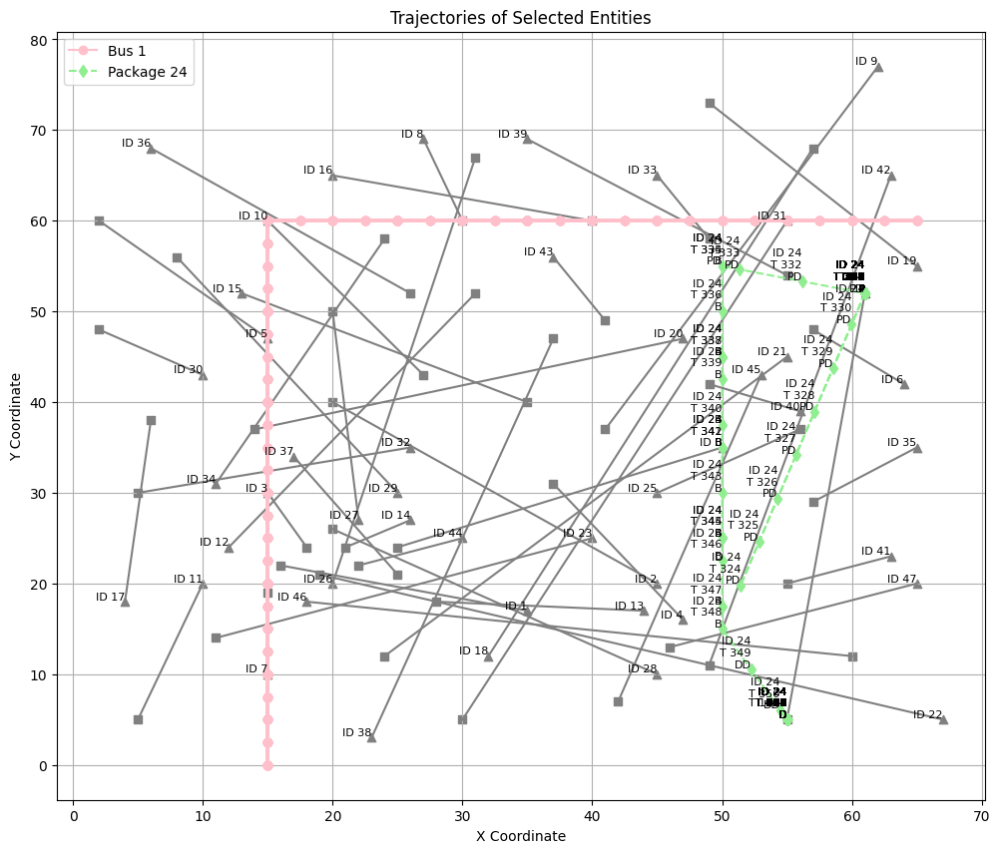

In [ ]:
import matplotlib.pyplot as plt

def plot_multiple_trajectories(simulation_records, package_records, drone_ids=None, bus_ids=None, package_ids=None):
    """
    绘制多个实体（无人机、巴士或包裹）的轨迹，并标注时间点。
    参数：
    - simulation_records: 模拟数据记录（包含无人机和巴士）
    - package_records: 包裹数据记录
    - drone_ids: 要绘制的无人机 ID 列表
    - bus_ids: 要绘制的巴士 ID 列表
    - package_ids: 要绘制的包裹 ID 列表
    """
    # 转换数据为 DataFrame
    sim_df = pd.DataFrame(simulation_records)
    pkg_df = pd.DataFrame(package_records)

    # 创建绘图
    fig, ax = plt.subplots(figsize=(12, 10))

    # plot pick up (triangle) and delivery (square) for each pair and label
    for ind in sorted_tasks.index:
        ax.scatter(sorted_tasks.iloc[ind]['pickup_x'], sorted_tasks.iloc[ind]['pickup_y'], marker='^', c='grey')
        ax.scatter(sorted_tasks.iloc[ind]['delivery_x'], sorted_tasks.iloc[ind]['delivery_y'], marker='s', c='grey')
        ax.plot(sorted_tasks.iloc[ind][['pickup_x', 'delivery_x']], 
                sorted_tasks.iloc[ind][['pickup_y', 'delivery_y']], c='grey')
        ax.text(sorted_tasks.iloc[ind]['pickup_x'], sorted_tasks.iloc[ind]['pickup_y'], 
                f"ID {ind}", fontsize=8, color="black", ha="right", va="bottom")

    # 绘制无人机轨迹
    if drone_ids:
        for drone_id in drone_ids:
            drone_df = sim_df[(sim_df["entity"] == "drone") & (sim_df["id"] == drone_id)]
            if not drone_df.empty:
                ax.plot(drone_df["x"], drone_df["y"], linestyle="-", marker="^", 
                       label=f"Drone {drone_id}", color="lightblue")
                for _, row in drone_df.iterrows():
                    ax.text(row["x"], row["y"], str(row["time"]), 
                           fontsize=8, color="black", ha="right", va="bottom")
            else:
                print(f"No data found for Drone ID {drone_id}.")

    # 绘制巴士轨迹
    if bus_ids:
        for bus_id in bus_ids:
            bus_df = sim_df[(sim_df["entity"] == "bus") & (sim_df["id"] == bus_id)]
            if not bus_df.empty:
                ax.plot(bus_df["x"], bus_df["y"], linestyle="-", marker="o", 
                       label=f"Bus {bus_id}", color="pink")
            else:
                print(f"No data found for Bus ID {bus_id}.")

    # 绘制包裹轨迹
    if package_ids:
        for package_id in package_ids:
            package_df = pkg_df[pkg_df["package_id"] == package_id]
            if not package_df.empty:
                # 绘制轨迹线
                ax.plot(package_df["x"], package_df["y"], linestyle="--", marker="d", 
                       label=f"Package {package_id}", color="lightgreen")
                
                # 标注每个时间点的位置、Package ID和状态
                for _, row in package_df.iterrows():
                    status_abbr = {
                        'at_pickup_point': 'P',
                        'on_pickup_drone': 'PD',
                        'on_bus': 'B',
                        'on_delivery_drone': 'DD',
                        'on_direct_delivery_drone': 'DDD',  # 新增状态缩写
                        'delivered': 'D'
                    }.get(row['status'], '?')
                    
                    ax.text(row["x"], row["y"], 
                           f"ID {package_id}\nT {row['time']}\n{status_abbr}", 
                           fontsize=8, color="black", ha="right", va="bottom")
            else:
                print(f"No data found for Package ID {package_id}.")

    # 设置图表样式
    ax.set_title("Trajectories of Selected Entities")
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.grid(True)
    ax.legend()
    plt.show()

# 示例调用
drone_ids = []
bus_ids = [1]
package_ids = [39]

# 绘制轨迹
plot_multiple_trajectories(simulation_records, package_records, 
                         drone_ids=drone_ids, bus_ids=bus_ids, package_ids=package_ids)

In [ ]:
import pandas as pd
import numpy as np

def run_simulation(task_subset, tolerance_value):
    # 重置所有全局变量
    global task_index, current_time, packages, simulation_records, bus_records, package_records
    task_index = 0
    current_time = 0
    simulation_records = []
    bus_records = []
    package_records = []
    
    # 初始化系统
    drone_fleet = DroneFleet()
    bus_system = BusSystem()
    bus_system.simulate(bus_lines, bus_stations_df)
    
    # 初始化任务和包裹
    tasks = task_subset.copy()  # 使用提供的任务子集
    packages = []
    
    for task in tasks:
        task['pickup_status'] = 'unassigned'
        task['delivery_status'] = 'unassigned'
        package = Package(task['index'], task['index'])
        packages.append(package)
        task['package_id'] = task['index']
    
    # 运行模拟
    while current_time <= total_time:

        bus_system.simulate(bus_lines, bus_stations_df)


        # 定期检查并处理等待队列中的任务
        drone_fleet.process_delivery_task_queue()
        drone_fleet.process_pickup_task_queue()
        drone_fleet.process_direct_task_queue()
        while task_index < len(tasks) and tasks[task_index]['pickup_time'] <= current_time:
            task = tasks[task_index]
            if task['pickup_status'] == 'unassigned':
                #
                # 计算运输距离
                bus_distance, drone_distance = calculate_transport_distance(
                    task['pickup_x'], task['pickup_y'], task['delivery_x'], task['delivery_y'],
                    bus_stations, bus_lines
                )
                if task['index'] == 24:  # 或使用 task['package_id'] == 24，取决于你的实际标识符
                    # ID 24 强制使用直接配送
                    success_pickup = drone_fleet.try_allocate_direct_transport(
                        task, 
                        task['pickup_x'], 
                        task['pickup_y'], 
                        task['delivery_x'], 
                        task['delivery_y']
                    )
                    print(f"\nProcessing Task 24 at time {current_time}:")
                    print(f"Current task index: {task_index}")
                    print(f"Pickup location: ({task['pickup_x']}, {task['pickup_y']})")
                    print(f"Delivery location: ({task['delivery_x']}, {task['delivery_y']})")
                    
                    if not success_pickup:
                        drone_fleet.add_direct_task_to_queue(
                            task,
                            task['pickup_x'],
                            task['pickup_y'],
                            task['delivery_x'],
                            task['delivery_y']
                        )
                # 选择运输方式
                elif drone_distance - tolerance < bus_distance:
                    # 直接用无人机运输
                    success_pickup = drone_fleet.try_allocate_direct_transport(task, task['pickup_x'], task['pickup_y'], task['delivery_x'], task['delivery_y'])
                    if not success_pickup:
                        drone_fleet.add_direct_task_to_queue(task, task['pickup_x'], task['pickup_y'],task['delivery_x'], task['delivery_y'],)
                else:
                    # 使用巴士运输（原有逻辑）
                    best_line, min_distance = calculate_best_line(
                        task['pickup_x'], task['pickup_y'], task['delivery_x'], task['delivery_y'], 
                        bus_stations, bus_lines
                    )
                    task['line'] = best_line

                    success_pickup = drone_fleet.try_allocate_pickup_task(task, task['pickup_x'], task['pickup_y'])
                    if not success_pickup:
                        drone_fleet.add_pickup_task_to_queue(task, task['pickup_x'], task['pickup_y'])

                    success_delivery = drone_fleet.try_allocate_delivery_task(task, task['delivery_x'], task['delivery_y'], auto_create_drone=False)
                    if not success_delivery:
                        drone_fleet.add_delivery_task_to_queue(task, task['delivery_x'], task['delivery_y'])
                    
                    # 记录取货时间，用于延迟分配送货任务
                    # task['pickup_assignment_time'] = current_time

            task_index += 1


        drone_fleet.move_all_drones()
        bus_system.simulate(bus_lines, bus_stations_df)


        


        # 记录每个 package 的当前状态和位置
        # 更新包裹状态并记录
        for package in packages:
            task = get_task_by_id(package.task_id)  # Find the associated task
            if package.status == 'at_pickup_point':
                x, y = task['pickup_x'], task['pickup_y']
            elif package.status == 'on_pickup_drone':
                drone = next((drone for drone in drone_fleet.drones if drone.current_task and drone.current_task['package_id'] == package.package_id), None)
                x, y = (drone.x, drone.y) if drone else (None, None)
            elif package.status == 'on_bus':
                bus = next((bus for bus in bus_system.buses if bus.current_package == package), None) # 遍历 bus_system.buses 中的所有公交车，查找当前携带该包裹 (package.package_id) 的公交车。
                x, y = (bus.x, bus.y) if bus else (None, None)
            elif package.status == 'on_delivery_drone':
                drone = next((drone for drone in drone_fleet.drones if drone.current_task and drone.current_task['package_id'] == package.package_id), None)
                x, y = (drone.x, drone.y) if drone else (None, None)
            elif package.status == 'delivered':
                x, y = task['delivery_x'], task['delivery_y']
            elif package.status == 'on_direct_drone':
                drone = next((drone for drone in drone_fleet.drones if drone.current_task and drone.current_task['package_id'] == package.package_id), None)
                x, y = (drone.x, drone.y) if drone else (None, None)
            elif package.status == 'directly_delivered':
                x, y = task['delivery_x'], task['delivery_y']

            # 记录包裹状态
            package_records.append({
                "time": current_time,
                "package_id": package.package_id,
                "task_id": package.task_id,
                "status": package.status,
                "x": x,
                "y": y
            })
        # 在主循环中打印队列
        # print(f"Time {current_time}: Delivery Task Queue")
        # for task in drone_fleet.delivery_task_queue:
        #     print(f"Task {task['pickup_task']} - Pickup: {task['pickup_status']}, Delivery: {task['delivery_status']}")

        for drone in drone_fleet.drones:
            simulation_records.append({
                "time": current_time,
                "entity": "drone",
                "id": drone.drone_id,
                "x": drone.x,
                "y": drone.y,
                "status": drone.status
            })

        for bus in bus_system.buses:
            simulation_records.append({
                "time": current_time,
                "entity": "bus",
                "id": bus.bus_id,
                "x": bus.x,
                "y": bus.y,
                "status": bus.status,
                "direction": bus.direction
            })

        for bus in bus_system.buses:
            # 获取当前站点编号
            current_station = station_mapping.get((bus.x, bus.y), None)
            if current_station is not None:
                # 获取对应的 station_index 和线路信息
                station_index = next(
                    (station['station_index'] for station in bus.route if station['x'] == bus.x and station['y'] == bus.y),
                    None
                )
                line = bus.route[0]['line'] if bus.route else None  # 假设所有站点的 line 一致

                # 记录数据
                bus_records.append({
                    "time": current_time,
                    "entity": "bus",
                    "id": bus.bus_id,
                    "station": current_station,       # 站点名称或编号
                    "station_index": station_index,  # 站点索引
                    "line": line,                    # 所属线路
                    "has_package": bus.current_package is not None  # 判断是否携带包裹
                })


        for drone in drone_fleet.drones:
            if (
                drone.status == 'waiting_at_bus_station_for_pickup_bus' and 
                drone.current_task is not None and 
                drone.current_task['pickup_status'] == 'waiting_for_bus'
            ):
                # 确定当前任务所在的线路
                current_line = drone.current_task['line']
                print(drone.current_task['package_id'])
                # print(current_line+'芜湖起飞')

                
                # 检查当前位置是否为两条线路的交界处
                intersecting_lines = [
                    line for line in bus_lines
                    if any(station for station in bus_stations if station.line == line and station.x == drone.x and station.y == drone.y)
                ]
                
                # 如果是交界处，确保无人机在等当前线路的大巴
                if len(intersecting_lines) > 1 and current_line not in intersecting_lines:
                    print(f"Error: Drone {drone.drone_id} is at an intersection but not waiting for the correct line.")
                    continue
                
                nearest_delivery_station = find_nearest_bus_station(
                    drone.current_task['delivery_x'], 
                    drone.current_task['delivery_y'], 
                    bus_stations, 
                    current_line
                )

                bus = bus_system.check_buses_at_station_for_pickup(
                    drone.x, 
                    drone.y, 
                    line=current_line, 
                    delivery_station=(nearest_delivery_station.x, nearest_delivery_station.y)
    )
                
                if bus and bus.can_pickup_package():
                    package = get_package_by_id(drone.current_task['package_id'])
                    bus.load_package(package)
                    package.bus_id = bus.bus_id  # Associate the package with the bus
                    package.update_status('on_bus')
                    drone.current_task['pickup_status'] = 'completed'
                    drone.current_task = None
                    drone.status = 'idle'
                    drone.pickup_tasks_completed += 1
                    # if package.package_id == 11:
                    #     print(f"芜湖起飞Debug Package 11: Time {current_time}, Status: {package.status}, Bus: {package.bus_id}")
                    #     print(f"不会吧 这也不显示吗Package 11 is assigned to line: {task['line']}")
                

            elif drone.status == 'waiting_at_bus_station_for_delivery':
                # Modify this line to use the correct function
                package = get_package_by_id(drone.current_task['package_id'])  # Ensure package is retrieved first
                bus = bus_system.check_buses_at_station_for_delivery(drone.x, drone.y, package.bus_id)

                if package.package_id == 11:
                    print(f"Debug Package 11: Time {current_time}, Status: {package.status}, Bus: {package.bus_id}")
                
                if bus and bus.current_package:
                    package = bus.unload_package()
                    # print(f"Unloaded package ID: {package.package_id} 哈哈哈哈哈哈")  # 调试输出

                    package.update_status('on_delivery_drone')
                    task = get_task_by_id(package.task_id)
                    if task is not None:
                        drone.assign_delivery_task(task, task['delivery_x'], task['delivery_y'],task['line'] )
                        drone.status = 'moving_to_delivery'
                    else:
                        print(f"错误: 未找到 package_id 为 {package.package_id} 的任务")
                # else:
                #     print(f"错误: 未找到 package_id 为 {package.package_id} 的包裹或对应的巴士")

        current_time += 1
        

    
    # 统计结果
    direct_transport_count = 0
    bus_transport_count = 0
    
    for package in packages:
        if package.status in ['directly_delivered']:
            direct_transport_count += 1
        elif package.status in ['delivered']:
            bus_transport_count += 1
    active_drones = len([drone for drone in drone_fleet.drones])
    
    return {
        'num_tasks': len(task_subset),
        'Penalty': tolerance_value,
        'direct_transport': direct_transport_count,
        'bus_transport': bus_transport_count,
        'num_drones': active_drones 
    }

# 准备结果DataFrame
results = []

# 不同任务数量的实验
task_counts = [5, 10, 15, 20, 25, 30, 35, 40, 45, len(task_list)]
tolerance_values = [0, 5, 10, 15, 20, 25]

for num_tasks in task_counts:
    task_subset = task_list[:num_tasks]  # 取前n个任务
    
    for tolerance in tolerance_values:
        result = run_simulation(task_subset, tolerance)
        results.append(result)

# 创建结果DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# 可以保存结果
results_df.to_csv('simulation_results.csv', index=False)

[DEBUG] Package 0 status updated to on_pickup_drone.
Package 0 status changed: on_pickup_drone -> on_pickup_drone
Assigned pickup task 12.0 to Drone 0 at (50.0, 35.0).
Created new drone with ID 1.
[DEBUG] Package 0 status updated to on_pickup_drone.
Package 0 status changed: on_pickup_drone -> on_pickup_drone
0
Pickup task 2.0 added to the queue.
Created new drone with ID 2.
No idle drone available for direct transport task 21.0
Direct transport task 21.0 added to the direct queue.
0
No idle drone available for direct transport task 21.0
0
[DEBUG] Package 0 status updated to on_bus.
Package 0 status changed: on_bus -> on_bus
Package 0 loaded onto Bus 11.
[DEBUG] Package 0 status updated to on_bus.
Package 0 status changed: on_bus -> on_bus
[DEBUG] Package 1 status updated to on_pickup_drone.
Package 1 status changed: on_pickup_drone -> on_pickup_drone
Assigned pickup task 2.0 to Drone 0 at (35.0, 17.0).
Reassigned pickup task 2.0 successfully.
No idle drone available for direct transpo

In [27]:
results_df

,num_tasks,Penalty,direct_transport,bus_transport,num_drones
0,5,0,1,4,5
1,5,5,3,2,3
2,5,10,4,1,2
3,5,15,4,1,2
4,5,20,5,0,1
5,5,25,5,0,1
6,10,0,3,7,7
7,10,5,6,4,5
8,10,10,8,2,3
9,10,15,8,2,3


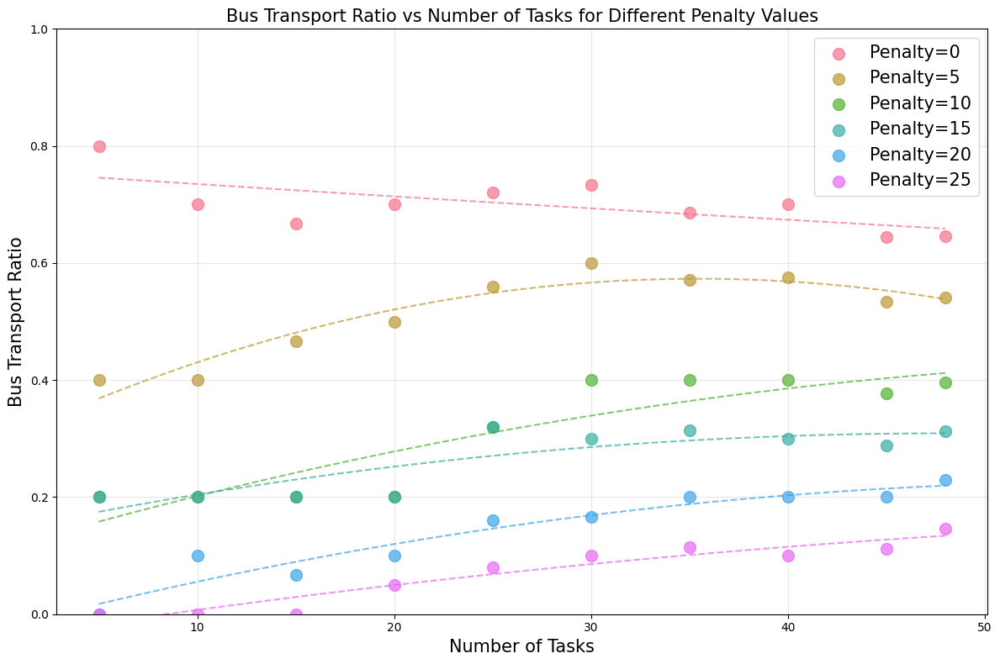

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np



results_df['bus_transport_ratio'] = results_df['bus_transport'] / results_df['num_tasks']

plt.style.use('default')
sns.set_palette("husl")
plt.figure(figsize=(12, 8))

# 为每个penalty值创建一个子数据集并绘制趋势线
for penalty in results_df['Penalty'].unique():
    mask = results_df['Penalty'] == penalty
    data = results_df[mask]
    
    plt.scatter(data['num_tasks'], data['bus_transport_ratio'],
               label=f'Penalty={penalty}', alpha=0.7, s=100)
    
    # 添加趋势线
    z = np.polyfit(data['num_tasks'], data['bus_transport_ratio'], 2)
    p = np.poly1d(z)
    x_trend = np.linspace(data['num_tasks'].min(), data['num_tasks'].max(), 100)
    plt.plot(x_trend, p(x_trend), '--', alpha=0.7)

plt.xlabel('Number of Tasks', fontsize=15)
plt.ylabel('Bus Transport Ratio', fontsize=15)
plt.title('Bus Transport Ratio vs Number of Tasks for Different Penalty Values', fontsize=15)
plt.legend(prop={'size': 15})
plt.grid(True, alpha=0.3)
plt.ylim(0, 1)

plt.tight_layout()
plt.show()

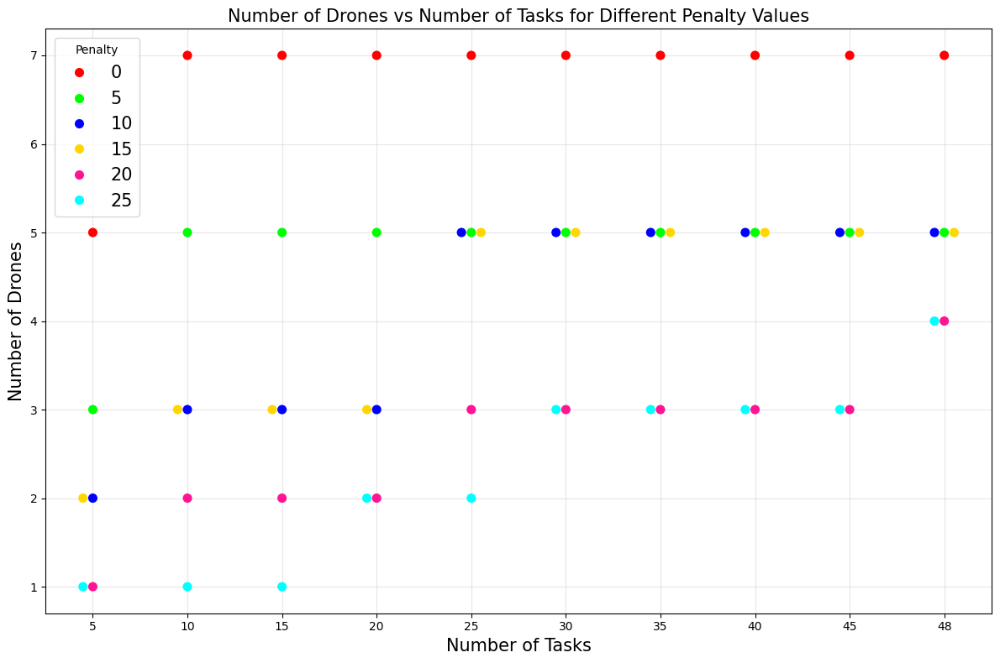

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))

# 自定义颜色方案，使用高对比度的颜色
colors = ['#FF0000', '#00FF00', '#0000FF', '#FFD700', '#FF1493', '#00FFFF']

sns.swarmplot(data=results_df, x='num_tasks', y='num_drones', 
              hue='Penalty', size=8, 
              palette=colors)

plt.xlabel('Number of Tasks', fontsize=15)
plt.ylabel('Number of Drones', fontsize=15)
plt.title('Number of Drones vs Number of Tasks for Different Penalty Values', fontsize=15)
plt.legend(prop={'size': 15}, title='Penalty')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [30]:
import pandas as pd

# 假设您的 package_simulation_df 已经加载为 DataFrame

# 定义函数来计算总运输时间和运输方式
def calculate_task_transport_times(package_df):
    # 按 package_id 分组
    transport_data = []
    grouped = package_df.groupby("task_id")
    
    for task_id, group in grouped:
        # 确定 pickup 和 delivery 的时间
        group = group.sort_values(by="time")
        pickup_time = group[group["status"].str.contains("on_pickup_drone|on_direct_drone")]["time"].min()
        delivery_time = group[group["status"].str.contains("delivered|directly_delivered")]["time"].min()
        
        # 确保 pickup_time 和 delivery_time 存在
        if pd.notna(pickup_time) and pd.notna(delivery_time):
            total_time = delivery_time - pickup_time
            
            # 确定运输方式
            if group["status"].str.contains("direct").any():
                transport_method = "direct_transport"
            else:
                transport_method = "transported_with_drone_bus"
            
            # 记录信息
            transport_data.append({
                "task_id": task_id,
                "pickup_time": pickup_time,
                "delivery_time": delivery_time,
                "total_time": total_time,
                "transport_method": transport_method
            })
    
    # 转换为 DataFrame
    return pd.DataFrame(transport_data)

task_transport_df = calculate_task_transport_times(package_simulation_df)
task_transport_df

,task_id,pickup_time,delivery_time,total_time,transport_method
0,0,15,34,19,transported_with_drone_bus
1,1,20,28,8,direct_transport
2,2,29,41,12,direct_transport
3,3,35,39,4,direct_transport
4,4,40,50,10,direct_transport
5,5,42,47,5,direct_transport
6,6,48,62,14,direct_transport
7,7,63,76,13,direct_transport
8,8,65,71,6,direct_transport
9,9,61,76,15,transported_with_drone_bus


In [31]:
# # 假设 task_transport_df 和 task_transport_df_mix 已经加载为 DataFrame

# 重命名 task_transport_df 的 total_time 列为 direct_time
task_transport_df = task_transport_df.rename(columns={'total_time': 'direct_time'})

# 合并两个 DataFrame
# 假设两者均有相同的 task_id
merged_df = pd.merge(task_transport_df_mix, task_transport_df[['task_id', 'direct_time']], 
                     on='task_id', how='left')

# 调整列顺序，将 direct_time 放在 total_time 的右侧
cols = list(merged_df.columns)
total_time_index = cols.index('total_time')
cols = cols[:total_time_index + 1] + ['direct_time'] + cols[total_time_index + 1:-1]
merged_df = merged_df[cols]

merged_df.to_csv('tolerance_10_total_direct_time.csv')
merged_df = pd.read_csv('tolerance_10_total_direct_time.csv')
merged_df

NameError: name 'task_transport_df_mix' is not defined

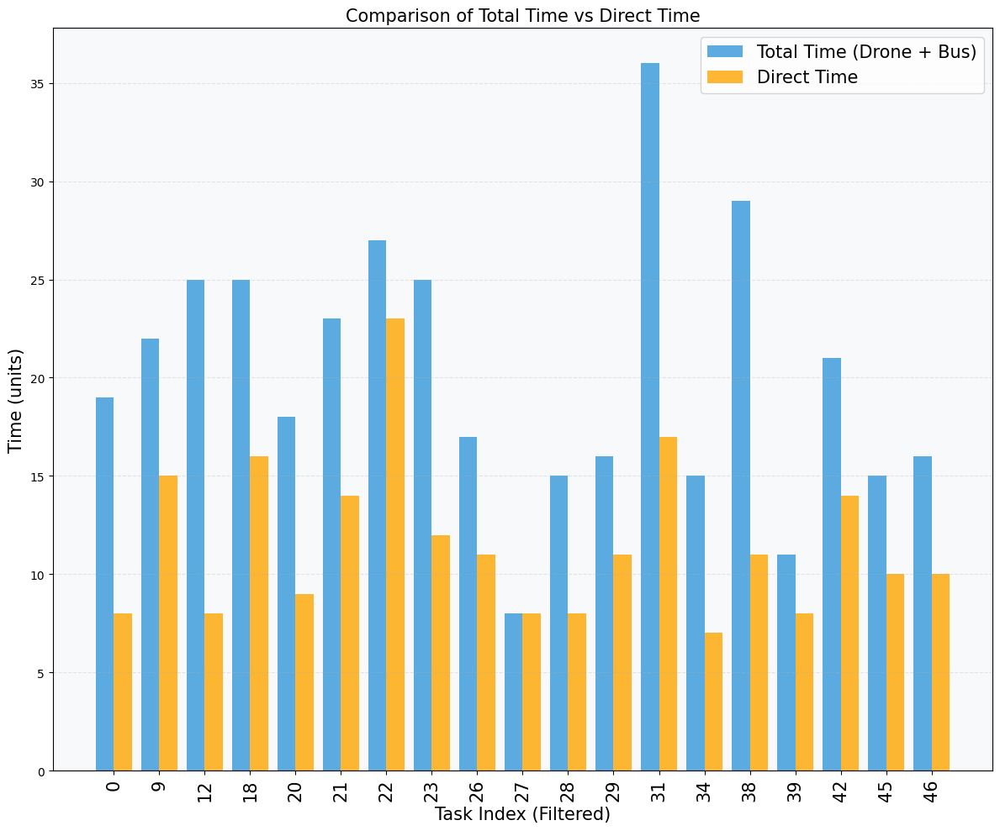

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 设置风格
# plt.style.use('seaborn')
sns.set_palette("husl")

# 颜色定义
color1 = '#3498db'  # 蓝色
color2 = 'orange'  # 红色

plt.figure(figsize=(12, 10))
x = range(len(filtered_df))

# 绘制柱状图
plt.bar(x, filtered_df['total_time'], width=0.4, 
        label='Total Time (Drone + Bus)', 
        align='center', 
        color=color1,
        alpha=0.8)
plt.bar([i + 0.4 for i in x], filtered_df['direct_time'], 
        width=0.4, 
        label='Direct Time', 
        align='center',
        color=color2,
        alpha=0.8)

# 添加标签
plt.xlabel('Task Index (Filtered)', fontsize=15)
plt.ylabel('Time (units)', fontsize=15)
plt.title('Comparison of Total Time vs Direct Time', fontsize=15)
plt.xticks([i + 0.2 for i in x], filtered_df['task_id'], rotation=90, fontsize=15)
plt.legend(fontsize=15, loc='upper right')

# 添加网格
plt.grid(axis='y', linestyle='--', alpha=0.3)

# 设置背景
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().set_facecolor('white')

plt.tight_layout()
plt.show()

In [ ]:
# 筛选 pickup_status 或 delivery_status 不为 'completed' 的任务
unfinished_tasks = [
    task for task in tasks 
    if task['pickup_status'] != 'completed' or task['delivery_status'] != 'completed'
]

# 打印未完成任务的信息
print(f"Total unfinished tasks: {len(unfinished_tasks)}")
for task in unfinished_tasks:
    print(task['index'])

Total unfinished tasks: 0


## Static movement

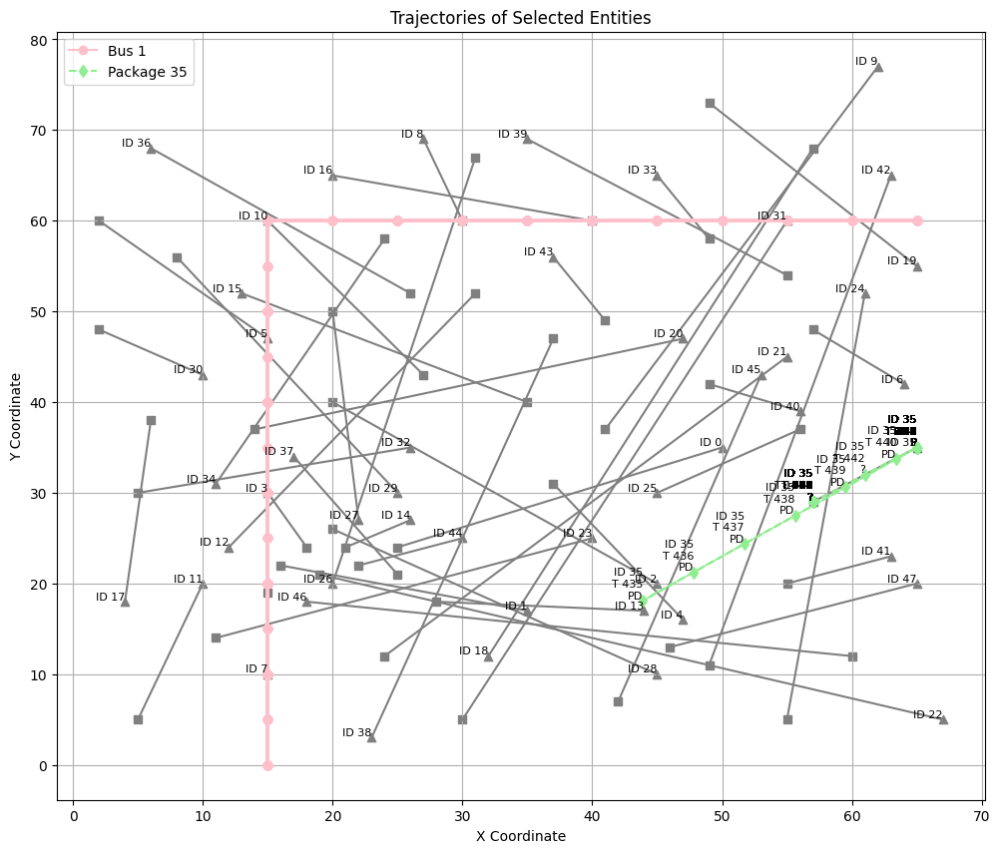

In [ ]:
import matplotlib.pyplot as plt

def plot_multiple_trajectories(simulation_records, package_records, drone_ids=None, bus_ids=None, package_ids=None):
    """
    绘制多个实体（无人机、巴士或包裹）的轨迹，并标注时间点。
    参数：
    - simulation_records: 模拟数据记录（包含无人机和巴士）
    - package_records: 包裹数据记录
    - drone_ids: 要绘制的无人机 ID 列表
    - bus_ids: 要绘制的巴士 ID 列表
    - package_ids: 要绘制的包裹 ID 列表
    """
    # 转换数据为 DataFrame
    sim_df = pd.DataFrame(simulation_records)
    pkg_df = pd.DataFrame(package_records)

    # 创建绘图
    fig, ax = plt.subplots(figsize=(12, 10))

    # plot pick up (triangle) and delivery (square) for each pair and label
    for ind in sorted_tasks.index:
        ax.scatter(sorted_tasks.iloc[ind]['pickup_x'], sorted_tasks.iloc[ind]['pickup_y'], marker='^', c='grey')
        ax.scatter(sorted_tasks.iloc[ind]['delivery_x'], sorted_tasks.iloc[ind]['delivery_y'], marker='s', c='grey')
        ax.plot(sorted_tasks.iloc[ind][['pickup_x', 'delivery_x']], 
                sorted_tasks.iloc[ind][['pickup_y', 'delivery_y']], c='grey')
        ax.text(sorted_tasks.iloc[ind]['pickup_x'], sorted_tasks.iloc[ind]['pickup_y'], 
                f"ID {ind}", fontsize=8, color="black", ha="right", va="bottom")

    # 绘制无人机轨迹
    if drone_ids:
        for drone_id in drone_ids:
            drone_df = sim_df[(sim_df["entity"] == "drone") & (sim_df["id"] == drone_id)]
            if not drone_df.empty:
                ax.plot(drone_df["x"], drone_df["y"], linestyle="-", marker="^", 
                       label=f"Drone {drone_id}", color="lightblue")
                for _, row in drone_df.iterrows():
                    ax.text(row["x"], row["y"], str(row["time"]), 
                           fontsize=8, color="black", ha="right", va="bottom")
            else:
                print(f"No data found for Drone ID {drone_id}.")

    # 绘制巴士轨迹
    if bus_ids:
        for bus_id in bus_ids:
            bus_df = sim_df[(sim_df["entity"] == "bus") & (sim_df["id"] == bus_id)]
            if not bus_df.empty:
                ax.plot(bus_df["x"], bus_df["y"], linestyle="-", marker="o", 
                       label=f"Bus {bus_id}", color="pink")
            else:
                print(f"No data found for Bus ID {bus_id}.")

    # 绘制包裹轨迹
    if package_ids:
        for package_id in package_ids:
            package_df = pkg_df[pkg_df["package_id"] == package_id]
            if not package_df.empty:
                # 绘制轨迹线
                ax.plot(package_df["x"], package_df["y"], linestyle="--", marker="d", 
                       label=f"Package {package_id}", color="lightgreen")
                
                # 标注每个时间点的位置、Package ID和状态
                for _, row in package_df.iterrows():
                    status_abbr = {
                        'at_pickup_point': 'P',
                        'on_pickup_drone': 'PD',
                        'on_bus': 'B',
                        'on_delivery_drone': 'DD',
                        'on_direct_delivery_drone': 'DDD',  # 新增状态缩写
                        'delivered': 'D'
                    }.get(row['status'], '?')
                    
                    ax.text(row["x"], row["y"], 
                           f"ID {package_id}\nT {row['time']}\n{status_abbr}", 
                           fontsize=8, color="black", ha="right", va="bottom")
            else:
                print(f"No data found for Package ID {package_id}.")

    # 设置图表样式
    ax.set_title("Trajectories of Selected Entities")
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.grid(True)
    ax.legend()
    plt.show()

# 示例调用
drone_ids = []
bus_ids = [1]
package_ids = [35]

# 绘制轨迹
plot_multiple_trajectories(simulation_records, package_records, 
                         drone_ids=drone_ids, bus_ids=bus_ids, package_ids=package_ids)

## Bus plot

Buses for Line 1: [0, 1, 4, 5, 8, 9, 12, 13, 16, 17, 20, 21]
Buses for Line 2: [2, 3, 6, 7, 10, 11, 14, 15, 18, 19, 22, 23]


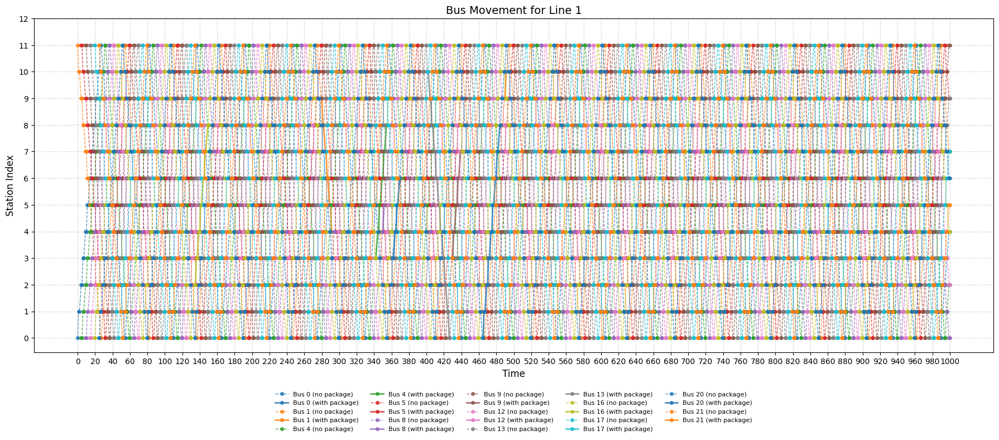

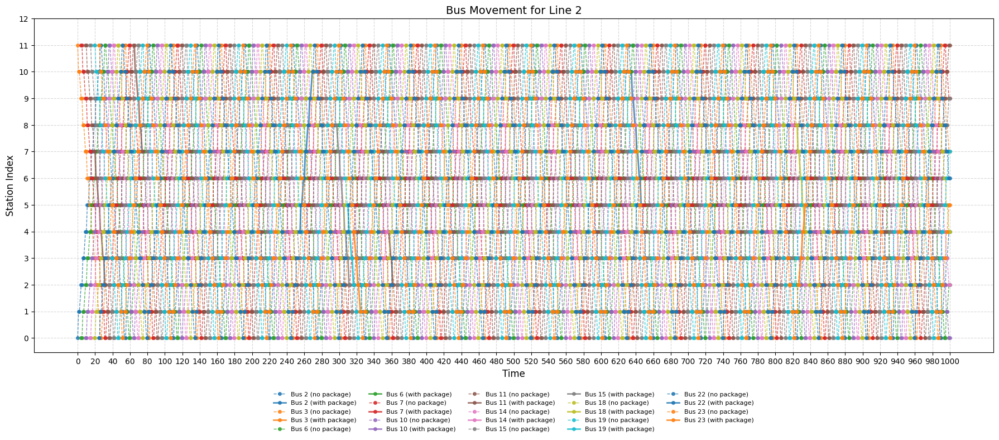

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def preprocess_disjoint_lines(df, x_column, y_column, max_gap):
    """
    对数据进行预处理，在 x 值差距超过 max_gap 的地方插入 np.nan，使线条断开。
    
    参数：
    - df: 输入 DataFrame，包含 x 和 y 数据
    - x_column: x 轴列名（例如 'time'）
    - y_column: y 轴列名（例如 'station_index'）
    - max_gap: x 值的最大允许差距
    
    返回：
    - x_processed, y_processed: 处理后的 x 和 y 列表
    """
    df_sorted = df.sort_values(by=x_column)
    x_processed = []
    y_processed = []

    for i in range(len(df_sorted)):
        if i > 0 and (df_sorted.iloc[i][x_column] - df_sorted.iloc[i - 1][x_column]) > max_gap:
            # 插入断点
            x_processed.append(np.nan)
            y_processed.append(np.nan)
        x_processed.append(df_sorted.iloc[i][x_column])
        y_processed.append(df_sorted.iloc[i][y_column])

    return x_processed, y_processed


def plot_bus_movements_by_line(simulation_df, num_stations, line1_buses, line2_buses):
    """
    分别绘制 Line 1 和 Line 2 的公交车在不同时间点的移动轨迹。
    - 实线表示有包裹
    - 虚线表示无包裹
    - 同一辆公交车保持相同颜色
    
    参数：
    - simulation_df: 包含公交车移动数据的 DataFrame
    - num_stations: 总站点数
    - line1_buses: Line 1 的公交车 ID 列表
    - line2_buses: Line 2 的公交车 ID 列表
    """
    max_gap = 10  # 时间差距的最大值

    # 绘制 Line 1
    plt.figure(figsize=(18, 8))
    plt.title("Bus Movement for Line 1", fontsize=14)
    color_map = {bus_id: plt.cm.tab10(i % 10) for i, bus_id in enumerate(line1_buses)}
    for bus_id in line1_buses:
        bus_data = simulation_df[simulation_df['id'] == bus_id]

        # 分离有包裹和无包裹的数据
        with_package = bus_data[bus_data['has_package']]
        without_package = bus_data[~bus_data['has_package']]

        # 预处理无包裹数据（虚线）
        time_without_package, station_without_package = preprocess_disjoint_lines(
            without_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_without_package,
            station_without_package,
            label=f'Bus {bus_id} (no package)',
            linestyle='--',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=1
        )

        # 预处理有包裹数据（实线加粗）
        time_with_package, station_with_package = preprocess_disjoint_lines(
            with_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_with_package,
            station_with_package,
            label=f'Bus {bus_id} (with package)',
            linestyle='-',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=2
        )

    # 设置图表样式
    plt.xlabel("Time", fontsize=12)
    plt.ylabel("Station Index", fontsize=12)
    plt.xticks(range(0, simulation_df['time'].max() + 1, 20), fontsize=10)
    plt.yticks(range(0, num_stations + 1), fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=5, fontsize=8, frameon=False)
    plt.tight_layout()
    plt.show()

    # 绘制 Line 2
    plt.figure(figsize=(18, 8))
    plt.title("Bus Movement for Line 2", fontsize=14)
    color_map = {bus_id: plt.cm.tab10(i % 10) for i, bus_id in enumerate(line2_buses)}
    for bus_id in line2_buses:
        bus_data = simulation_df[simulation_df['id'] == bus_id]

        # 分离有包裹和无包裹的数据
        with_package = bus_data[bus_data['has_package']]
        without_package = bus_data[~bus_data['has_package']]

        # 预处理无包裹数据（虚线）
        time_without_package, station_without_package = preprocess_disjoint_lines(
            without_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_without_package,
            station_without_package,
            label=f'Bus {bus_id} (no package)',
            linestyle='--',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=1
        )

        # 预处理有包裹数据（实线加粗）
        time_with_package, station_with_package = preprocess_disjoint_lines(
            with_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_with_package,
            station_with_package,
            label=f'Bus {bus_id} (with package)',
            linestyle='-',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=2
        )

    # 设置图表样式
    plt.xlabel("Time", fontsize=12)
    plt.ylabel("Station Index", fontsize=12)
    plt.xticks(range(0, simulation_df['time'].max() + 1, 20), fontsize=10)
    plt.yticks(range(0, num_stations + 1), fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=5, fontsize=8, frameon=False)
    plt.tight_layout()
    plt.show()
# 示例用法

# 初始化两个列表来存储 Line 1 和 Line 2 的 bus_id
line1_buses_full_list = []
line2_buses_full_list = []

# 遍历所有公交车
for bus in bus_system.buses:
    # 获取公交车的线路信息
    line = bus.route[0]['line'] if bus.route else None  # 假设 route 中的 line 一致
    if line == "Line 1":
        line1_buses_full_list.append(bus.bus_id)
    elif line == "Line 2":
        line2_buses_full_list.append(bus.bus_id)

# 输出结果
print("Buses for Line 1:", line1_buses_full_list)
print("Buses for Line 2:", line2_buses_full_list)


line1_buses = [ 0, 1, 4, 5, 8, 9, 12, 13, 16, 17, 20, 21]  # Line 1 的公交车 ID
line2_buses = [2, 3, 6, 7, 10, 11, 14, 15, 18, 19, 22, 23]  # Line 2 的公交车 ID
num_stations = bus_stations_df['station_index'].max() + 1  # 获取站点总数

plot_bus_movements_by_line(bus_simulation_df, num_stations, line1_buses, line2_buses)

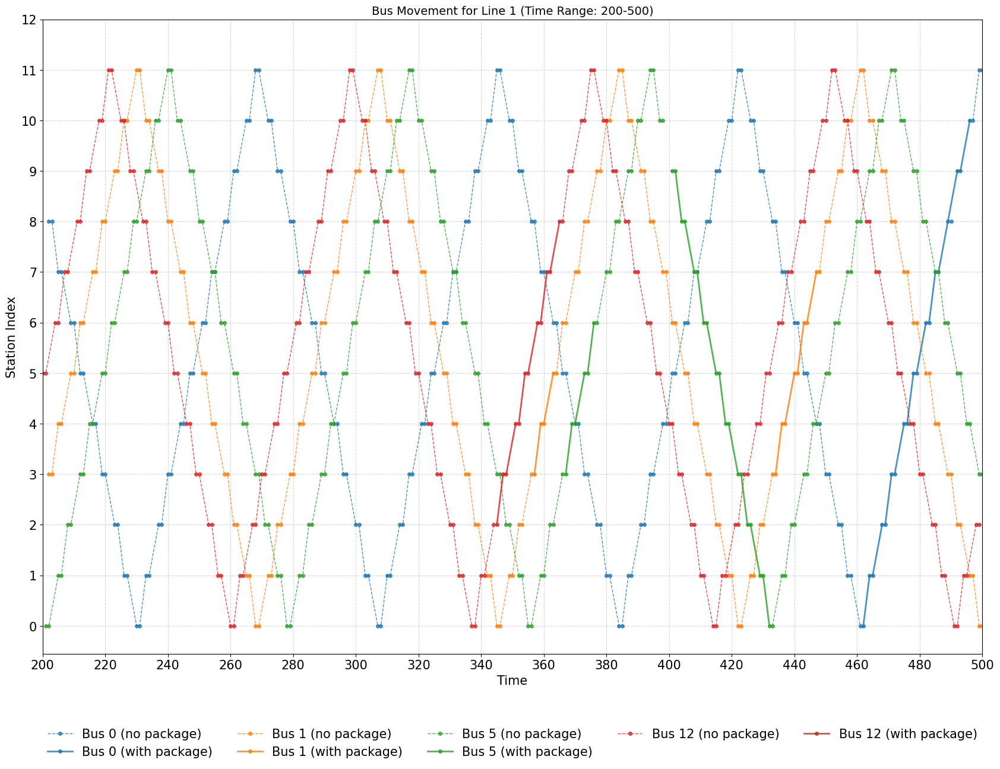

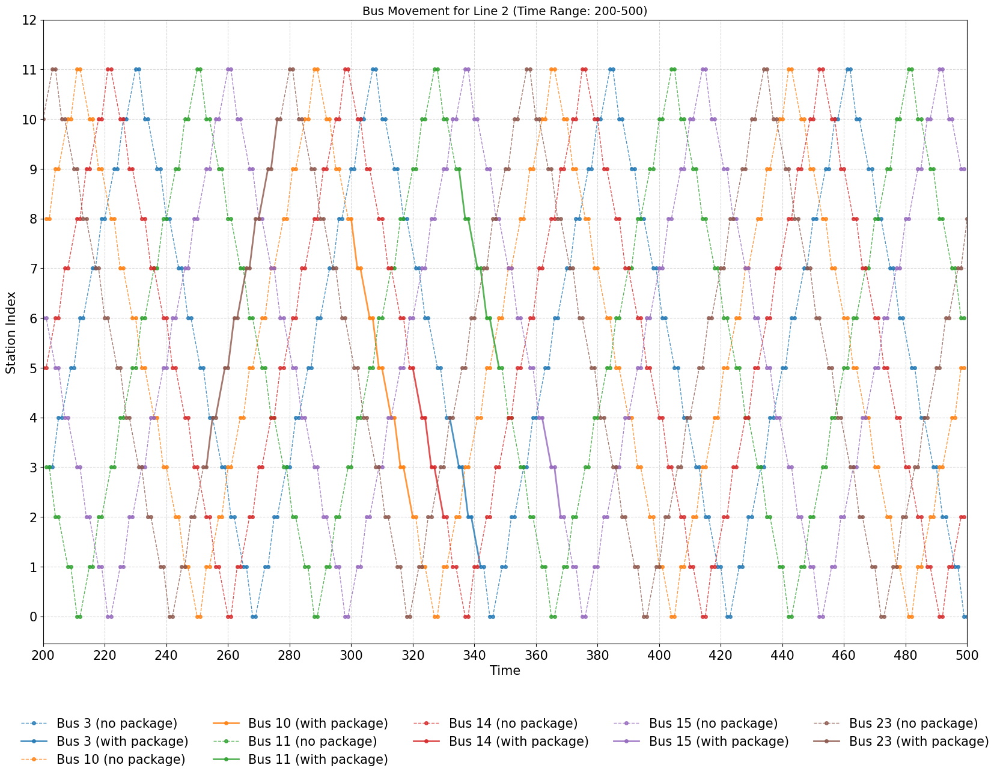

In [50]:
import numpy as np
import matplotlib.pyplot as plt

def preprocess_disjoint_lines(df, x_column, y_column, max_gap):
    """
    对数据进行预处理，在 x 值差距超过 max_gap 的地方插入 np.nan，使线条断开。
    
    参数：
    - df: 输入 DataFrame，包含 x 和 y 数据
    - x_column: x 轴列名（例如 'time'）
    - y_column: y 轴列名（例如 'station_index'）
    - max_gap: x 值的最大允许差距
    
    返回：
    - x_processed, y_processed: 处理后的 x 和 y 列表
    """
    df_sorted = df.sort_values(by=x_column).reset_index(drop=True)
    x_processed = []
    y_processed = []

    for i in range(len(df_sorted)):
        if i > 0 and (df_sorted.iloc[i][x_column] - df_sorted.iloc[i - 1][x_column]) > max_gap:
            # 插入断点
            x_processed.append(np.nan)
            y_processed.append(np.nan)
        x_processed.append(df_sorted.iloc[i][x_column])
        y_processed.append(df_sorted.iloc[i][y_column])

    return x_processed, y_processed


def plot_bus_movements_by_line(simulation_df, num_stations, line1_buses, line2_buses, time_range=None, only_package=False):
    """
    分别绘制 Line 1 和 Line 2 的公交车在不同时间点的移动轨迹。
    - 实线表示有包裹
    - 虚线表示无包裹
    - 同一辆公交车保持相同颜色
    
    参数：
    - simulation_df: 包含公交车移动数据的 DataFrame
    - num_stations: 总站点数
    - line1_buses: Line 1 的公交车 ID 列表
    - line2_buses: Line 2 的公交车 ID 列表
    - time_range: 可选，指定时间范围的元组 (start_time, end_time)
    - only_package: 如果为 True，只绘制有包裹的公交车。
    """
    max_gap = 5  # 时间差距的最大值

    # 处理时间范围
    if time_range:
        start_time, end_time = time_range
        filtered_df = simulation_df[(simulation_df['time'] >= start_time) & (simulation_df['time'] <= end_time)]
        time_range_text = f" (Time Range: {start_time}-{end_time})"
        tick_start = start_time
        tick_end = end_time
    else:
        filtered_df = simulation_df
        time_range_text = ""
        tick_start = 0
        tick_end = simulation_df['time'].max()

    # 如果只画有包裹的公交车
    if only_package:
        line1_buses = [
            bus_id for bus_id in line1_buses
            if filtered_df[(filtered_df['id'] == bus_id) & (filtered_df['has_package'])].shape[0] > 0
        ]
        line2_buses = [
            bus_id for bus_id in line2_buses
            if filtered_df[(filtered_df['id'] == bus_id) & (filtered_df['has_package'])].shape[0] > 0
        ]

    # 绘制 Line 1
    plt.figure(figsize=(18, 13))
    plt.title(f"Bus Movement for Line 1{time_range_text}", fontsize=14)
    color_map = {bus_id: plt.cm.tab10(i % 10) for i, bus_id in enumerate(line1_buses)}
    
    for bus_id in line1_buses:
        bus_data = filtered_df[filtered_df['id'] == bus_id].sort_values(by='time')

        # 分离有包裹和无包裹的数据
        with_package = bus_data[bus_data['has_package'] == True]
        without_package = bus_data[bus_data['has_package'] == False]

        # 预处理无包裹数据（虚线）
        time_without_package, station_without_package = preprocess_disjoint_lines(
            without_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_without_package,
            station_without_package,
            label=f'Bus {bus_id} (no package)',
            linestyle='--',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=1
        )

        # 预处理有包裹数据（实线加粗）
        time_with_package, station_with_package = preprocess_disjoint_lines(
            with_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_with_package,
            station_with_package,
            label=f'Bus {bus_id} (with package)',
            linestyle='-',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=2
        )

    # 设置图表样式
    plt.xlabel("Time", fontsize=15)
    plt.ylabel("Station Index", fontsize=15)
    plt.xlim(tick_start, tick_end)
    plt.xticks(range(tick_start, tick_end + 1, 20), fontsize=15)
    plt.yticks(range(0, num_stations + 1), fontsize=15)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=5, fontsize=15, frameon=False)
    plt.tight_layout()
    plt.show()

    # 绘制 Line 2
    plt.figure(figsize=(18, 13))
    plt.title(f"Bus Movement for Line 2{time_range_text}", fontsize=14)
    color_map = {bus_id: plt.cm.tab10(i % 10) for i, bus_id in enumerate(line2_buses)}
    for bus_id in line2_buses:
        bus_data = filtered_df[filtered_df['id'] == bus_id].sort_values(by='time')

        # 分离有包裹和无包裹的数据
        with_package = bus_data[bus_data['has_package'] == True]
        without_package = bus_data[bus_data['has_package'] == False]

        # 预处理无包裹数据（虚线）
        time_without_package, station_without_package = preprocess_disjoint_lines(
            without_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_without_package,
            station_without_package,
            label=f'Bus {bus_id} (no package)',
            linestyle='--',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=1
        )

        # 预处理有包裹数据（实线加粗）
        time_with_package, station_with_package = preprocess_disjoint_lines(
            with_package, 'time', 'station_index', max_gap
        )
        plt.plot(
            time_with_package,
            station_with_package,
            label=f'Bus {bus_id} (with package)',
            linestyle='-',
            color=color_map[bus_id],
            marker='o',
            markersize=4,
            alpha=0.8,
            linewidth=2
        )

    # 设置图表样式
    plt.xlabel("Time", fontsize=15)
    plt.ylabel("Station Index", fontsize=15)
    plt.xlim(tick_start, tick_end)
    plt.xticks(range(tick_start, tick_end + 1, 20), fontsize=15)
    plt.yticks(range(0, num_stations + 1), fontsize=15)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=5, fontsize=15, frameon=False)
    plt.tight_layout()
    plt.show()


line1_buses = [ 0, 1, 5, 8, 9, 12, 13, 16, 17, 20, 21]  # Line 1 的公交车 ID
line2_buses = [2, 3, 6, 7, 10, 11, 14, 15, 18, 19, 23]  # Line 2 的公交车 ID
num_stations = bus_stations_df['station_index'].max() + 1  # 获取站点总数

# 指定时间范围 280-500
# 仅绘制有包裹的公交车
plot_bus_movements_by_line(
    simulation_df=bus_simulation_df,
    num_stations=num_stations,
    line1_buses=line1_buses,
    line2_buses=line2_buses,
    time_range=(200, 500),
    only_package=True
)


## Package Analysis

In [ ]:
# package_simulation_df

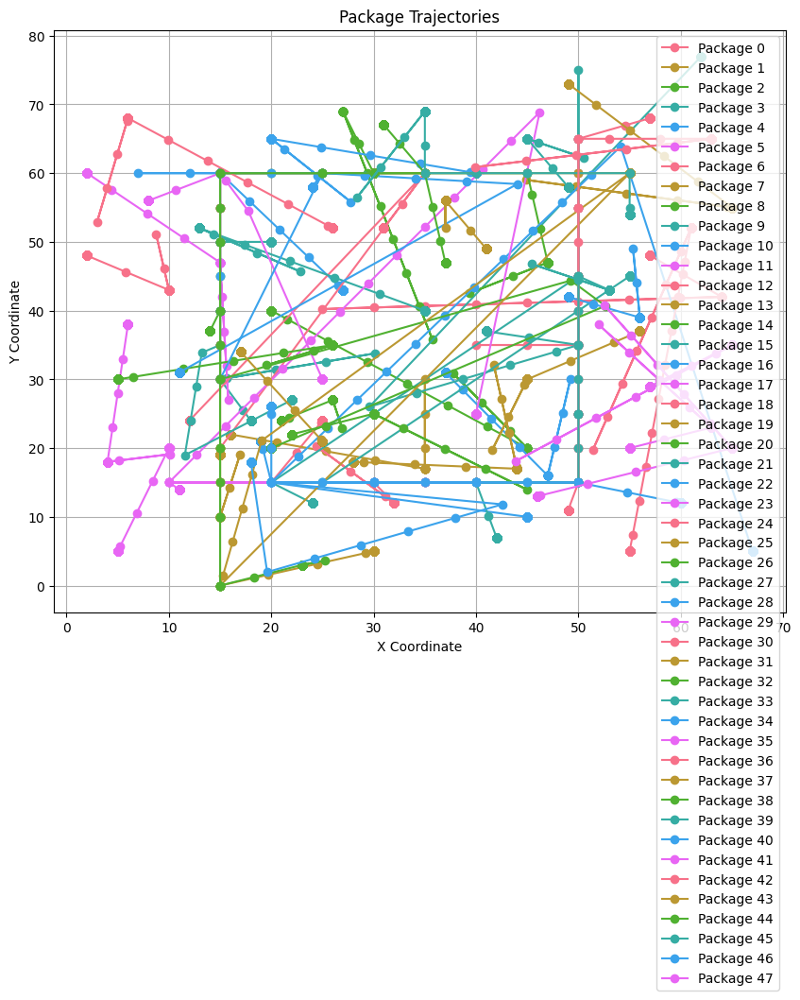

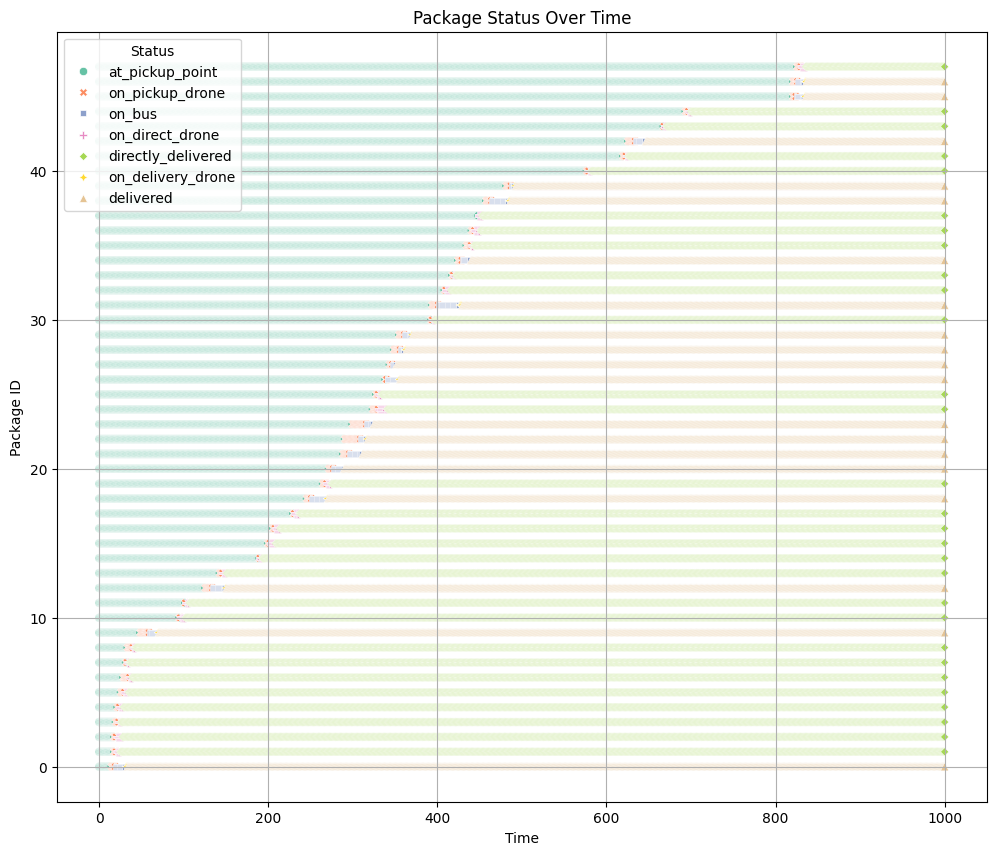

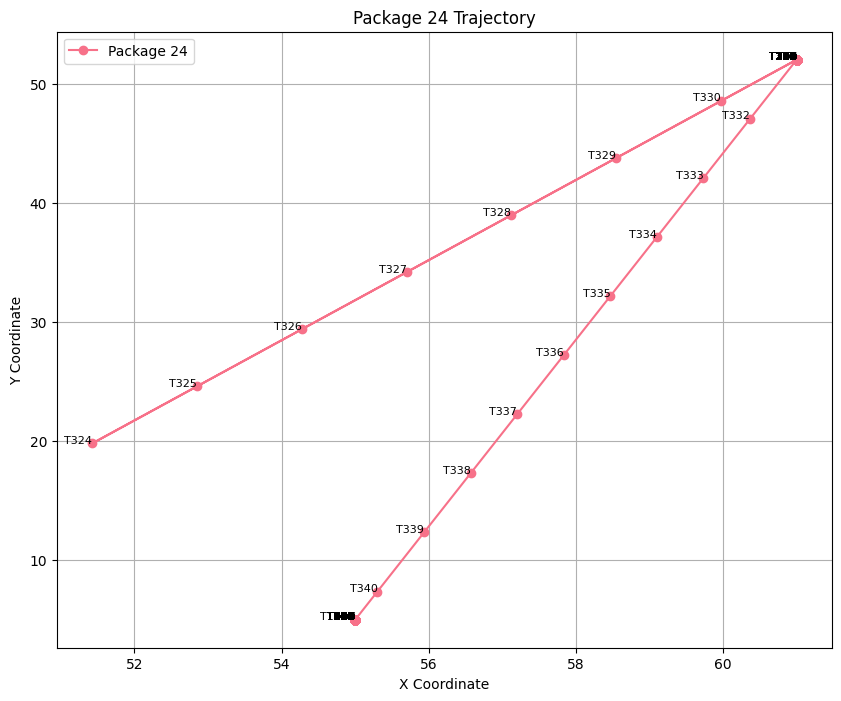

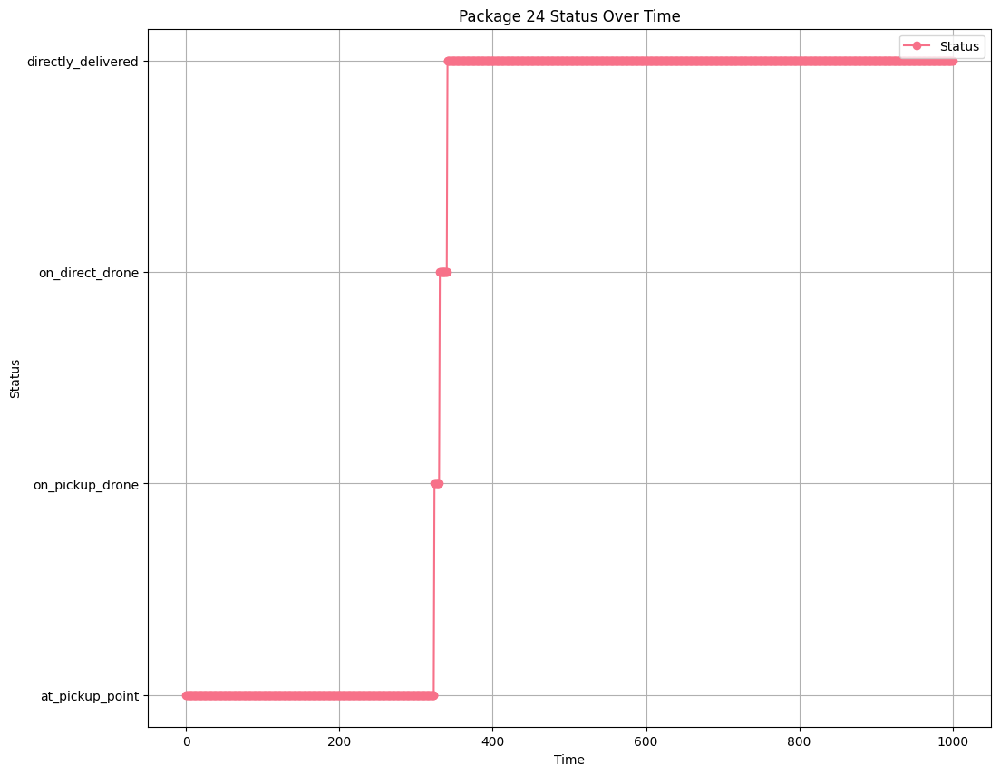

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 包裹轨迹图
def plot_package_trajectories(package_simulation_df):
    plt.figure(figsize=(10, 8))
    for package_id in package_simulation_df['package_id'].unique():
        package_data = package_simulation_df[package_simulation_df['package_id'] == package_id]
        plt.plot(package_data['x'], package_data['y'], marker='o', label=f'Package {package_id}')
    
    plt.title('Package Trajectories')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.legend()
    plt.grid(True)
    plt.show()

# 包裹状态变化时间图
def plot_package_status_over_time(package_simulation_df):
    plt.figure(figsize=(12, 10))
    sns.scatterplot(
        data=package_simulation_df,
        x='time',
        y='package_id',
        hue='status',
        palette='Set2',
        style='status',
        markers=True
    )
    plt.title('Package Status Over Time')
    plt.xlabel('Time')
    plt.ylabel('Package ID')
    plt.grid(True)
    plt.legend(title='Status', loc='upper left')
    plt.show()

# 单个包裹的轨迹和状态变化图
def plot_single_package(package_simulation_df, package_id):
    package_data = package_simulation_df[package_simulation_df['package_id'] == package_id]
    
    # 轨迹图
    plt.figure(figsize=(10, 8))
    plt.plot(package_data['x'], package_data['y'], marker='o', label=f'Package {package_id}')
    for _, row in package_data.iterrows():
        plt.text(row['x'], row['y'], f"T{row['time']}", fontsize=8, ha='right')
    plt.title(f'Package {package_id} Trajectory')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.grid(True)
    plt.legend()
    plt.show()

    # 状态变化图
    plt.figure(figsize=(12, 10))
    plt.plot(package_data['time'], package_data['status'], marker='o', linestyle='-', label='Status')
    plt.title(f'Package {package_id} Status Over Time')
    
    plt.xlabel('Time')
    plt.ylabel('Status')
    plt.grid(True)
    plt.legend()
    plt.show()

# 使用示例
# 假设 package_simulation_df 已经加载为 DataFrame
plot_package_trajectories(package_simulation_df)
plot_package_status_over_time(package_simulation_df)
plot_single_package(package_simulation_df, package_id=24)


In [ ]:
# bus_records

## Animation

/var/folders/58/tx0yktsx2rn9t9y3z4q7lcmc0000gn/T/ipykernel_39852/747858772.py:68: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  pickup_point.set_data(task['pickup_x'], task['pickup_y'])


Animation saved to try_simulation.gif


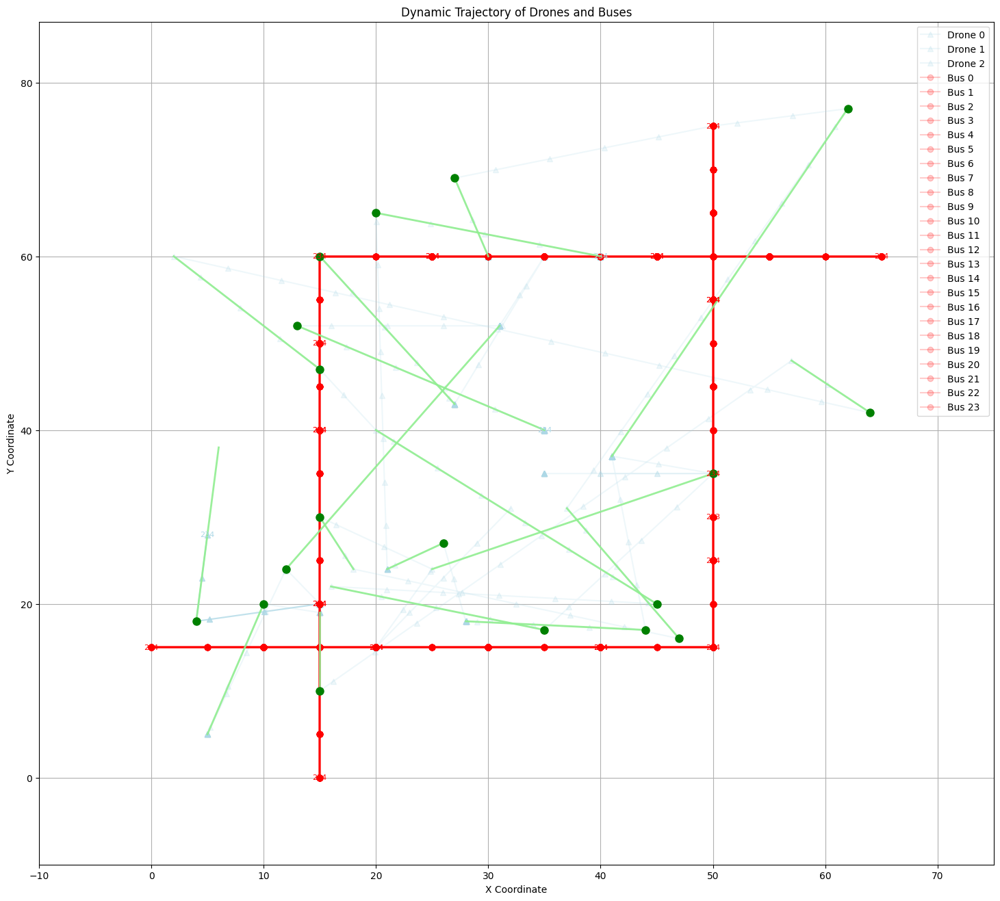

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import pandas as pd

def animate_and_save_simulation(simulation_records, task_list, save_path, file_format="gif"):
    """
    根据 simulation_records 动态绘制无人机和巴士的轨迹图，并在有新任务时连接 pickup 和 delivery 点，保存为指定格式。
    同时在 pickup point 标记黑点。
    
    参数：
    - simulation_records: 模拟数据记录
    - task_list: 任务列表（包含 pickup 和 delivery 数据）
    - save_path: 保存路径（包括文件名和后缀）
    - file_format: 保存的文件格式（默认为 "gif"）
    """
    # 将模拟数据转换为 DataFrame
    df = pd.DataFrame(simulation_records)
    
    # 设置图表
    fig, ax = plt.subplots(figsize=(18, 16))
    ax.set_xlim(df["x"].min() - 10, df["x"].max() + 10)
    ax.set_ylim(df["y"].min() - 10, df["y"].max() + 10)
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.set_title("Dynamic Trajectory of Drones and Buses")
    ax.grid(True)
    
    # 初始化绘图对象
    lines = {}
    texts = {}
    task_lines = {}  # 存储任务连线
    pickup_points = {}  # 存储任务的 pickup point 标记
    for entity_type, marker, color in [("drone", "^", "lightblue"), ("bus", "o", "red")]:
        entity_df = df[df["entity"] == entity_type]
        for entity_id in entity_df["id"].unique():
            # 初始化每个实体的轨迹线和标记点
            line, = ax.plot([], [], linestyle='-', marker=marker, color=color, alpha=0.2, label=f'{entity_type.capitalize()} {entity_id}')
            active_line, = ax.plot([], [], linestyle='-', marker=marker, color=color, alpha=0.7)  # 当前轨迹
            text = ax.text(0, 0, "", fontsize=8, ha='center', va='center', color=color)
            lines[f"{entity_type}_{entity_id}"] = (line, active_line)
            texts[f"{entity_type}_{entity_id}"] = text
    
    # 为任务创建浅绿色连线对象和黑点对象
    for task in task_list:
        line, = ax.plot([], [], linestyle='-', color='lightgreen', alpha=0.9, linewidth=2)
        point, = ax.plot([], [], linestyle='', marker='o', color='green', markersize=8)  # 黑色点
        task_lines[task['pickup_task']] = line
        pickup_points[task['pickup_task']] = point

    ax.legend()

    # 更新函数
    def update(frame):
        current_time = frame
        time_df = df[df["time"] <= current_time]  # 获取当前时间之前的所有数据

        # 更新任务连线和 pickup 点
        for task in task_list:
            if task['pickup_time'] <= current_time:
                # 更新绿色连线
                task_line = task_lines[task['pickup_task']]
                task_line.set_data(
                    [task['pickup_x'], task['delivery_x']],
                    [task['pickup_y'], task['delivery_y']]
                )
                # 更新黑点（pickup point）
                pickup_point = pickup_points[task['pickup_task']]
                pickup_point.set_data(task['pickup_x'], task['pickup_y'])
        
        # 更新实体轨迹
        for entity_type, marker, color in [("drone", "^", "lightblue"), ("bus", "o", "red")]:
            entity_df = time_df[time_df["entity"] == entity_type]
            for entity_id in entity_df["id"].unique():
                entity_data = entity_df[entity_df["id"] == entity_id]
                past_line, active_line = lines[f"{entity_type}_{entity_id}"]
                text = texts[f"{entity_type}_{entity_id}"]
                
                # 更新淡化轨迹（所有历史点）
                past_line.set_data(entity_data["x"], entity_data["y"])
                
                # 更新当前轨迹（最新 10 点）
                active_data = entity_data.tail(10)
                active_line.set_data(active_data["x"], active_data["y"])
                
                # 更新标记点
                if not entity_data.empty:
                    text.set_position((entity_data.iloc[-1]["x"], entity_data.iloc[-1]["y"]))
                    text.set_text(f"{entity_data.iloc[-1]['time']}")

    # 动画
    total_time = df["time"].max()  # 总时间范围
    ani = FuncAnimation(fig, update, frames=range(0, total_time + 1), interval=100, repeat=False)

    # 保存动画为 GIF
    ani.save(save_path, writer=PillowWriter(fps=10))
    print(f"Animation saved to {save_path}")

# 调用函数，保存动画为 GIF
save_path = "try_simulation.gif"  # 保存为 GIF 文件
animate_and_save_simulation(simulation_records[0:6000], task_list, save_path, file_format="gif")

## Package Animation

/var/folders/58/tx0yktsx2rn9t9y3z4q7lcmc0000gn/T/ipykernel_39852/2685783080.py:113: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  marker.set_data(x, y)
/var/folders/58/tx0yktsx2rn9t9y3z4q7lcmc0000gn/T/ipykernel_39852/2685783080.py:81: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  pickup_point.set_data(task['pickup_x'], task['pickup_y'])


KeyboardInterrupt: 

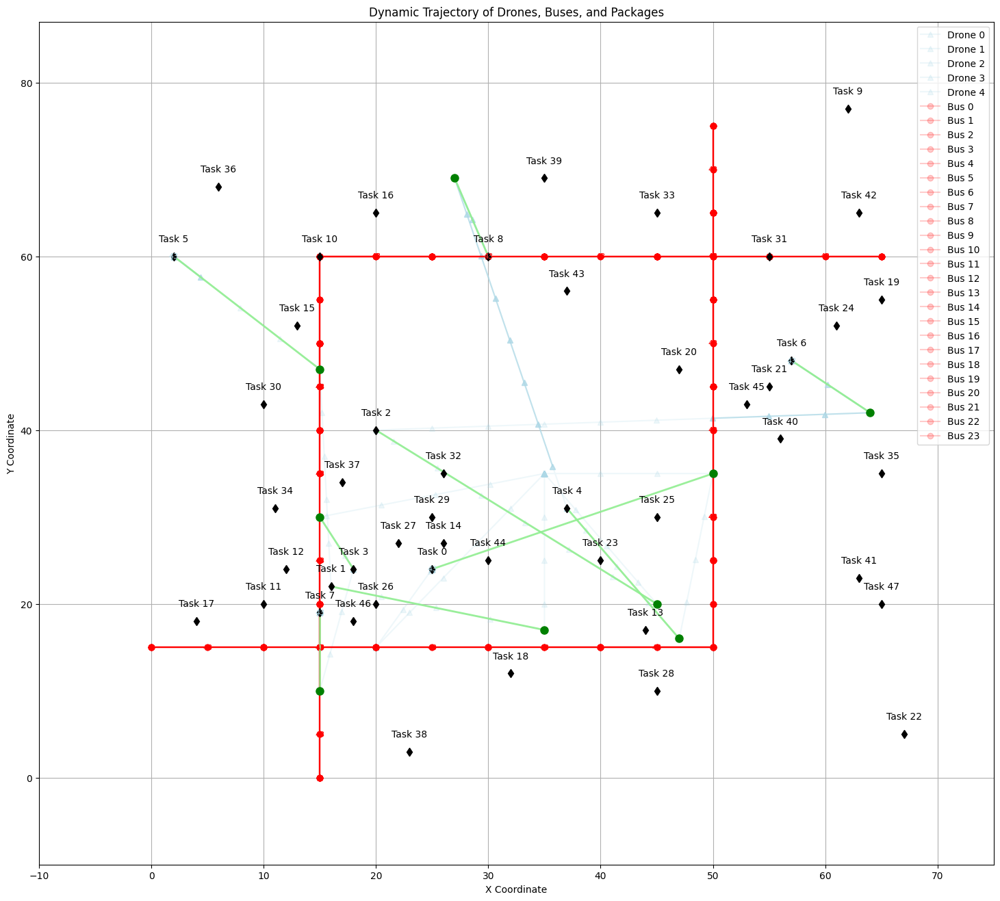

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import pandas as pd

def animate_and_save_simulation(simulation_records, task_list, package_records, save_path, file_format="gif"):
    """
    根据 simulation_records 动态绘制无人机和巴士的轨迹图，并在有新任务时连接 pickup 和 delivery 点，保存为指定格式。
    同时在 pickup point 标记黑点，并标注 package 的位置和任务 ID。

    参数：
    - simulation_records: 模拟数据记录
    - task_list: 任务列表（包含 pickup 和 delivery 数据）
    - package_records: 包裹数据记录（每时刻的 package 位置和状态）
    - save_path: 保存路径（包括文件名和后缀）
    - file_format: 保存的文件格式（默认为 "gif"）
    """
    # 将模拟数据转换为 DataFrame
    df = pd.DataFrame(simulation_records)
    package_df = pd.DataFrame(package_records)

    # 设置图表
    fig, ax = plt.subplots(figsize=(18, 16))
    ax.set_xlim(df["x"].min() - 10, df["x"].max() + 10)
    ax.set_ylim(df["y"].min() - 10, df["y"].max() + 10)
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.set_title("Dynamic Trajectory of Drones, Buses, and Packages")
    ax.grid(True)

    # 初始化绘图对象
    lines = {}
    texts = {}
    task_lines = {}  # 存储任务连线
    pickup_points = {}  # 存储任务的 pickup point 标记
    package_markers = {}  # 存储包裹标记
    package_texts = {}  # 存储包裹文本

    for entity_type, marker, color in [("drone", "^", "lightblue"), ("bus", "o", "red")]:
        entity_df = df[df["entity"] == entity_type]
        for entity_id in entity_df["id"].unique():
            # 初始化每个实体的轨迹线和标记点
            line, = ax.plot([], [], linestyle='-', marker=marker, color=color, alpha=0.2, label=f'{entity_type.capitalize()} {entity_id}')
            active_line, = ax.plot([], [], linestyle='-', marker=marker, color=color, alpha=0.7)  # 当前轨迹
            text = ax.text(0, 0, "", fontsize=8, ha='center', va='center', color=color)
            lines[f"{entity_type}_{entity_id}"] = (line, active_line)
            texts[f"{entity_type}_{entity_id}"] = text

    # 为任务创建浅绿色连线对象和黑点对象
    for task in task_list:
        line, = ax.plot([], [], linestyle='-', color='lightgreen', alpha=0.9, linewidth=2)
        point, = ax.plot([], [], linestyle='', marker='o', color='green', markersize=8)  # 黑色点
        task_lines[task['pickup_task']] = line
        pickup_points[task['pickup_task']] = point

    # 初始化包裹标记
    for package_id in package_df["package_id"].unique():
        marker, = ax.plot([], [], linestyle='', marker='d', color='black', markersize=6)  # 黑色菱形
        text = ax.text(0, 0, "", fontsize=10, ha='center', va='center', color='black')
        package_markers[package_id] = marker
        package_texts[package_id] = text

    ax.legend()

    # 更新函数
    def update(frame):
        current_time = frame
        time_df = df[df["time"] <= current_time]  # 获取当前时间之前的所有数据
        package_time_df = package_df[package_df["time"] == current_time]  # 获取当前时间的包裹数据

        # 更新任务连线和 pickup 点
        for task in task_list:
            if task['pickup_time'] <= current_time:
                # 更新绿色连线
                task_line = task_lines[task['pickup_task']]
                task_line.set_data(
                    [task['pickup_x'], task['delivery_x']],
                    [task['pickup_y'], task['delivery_y']]
                )
                # 更新黑点（pickup point）
                pickup_point = pickup_points[task['pickup_task']]
                pickup_point.set_data(task['pickup_x'], task['pickup_y'])

        # 更新实体轨迹
        for entity_type, marker, color in [("drone", "^", "lightblue"), ("bus", "o", "red")]:
            entity_df = time_df[time_df["entity"] == entity_type]
            for entity_id in entity_df["id"].unique():
                entity_data = entity_df[entity_df["id"] == entity_id]
                past_line, active_line = lines[f"{entity_type}_{entity_id}"]
                text = texts[f"{entity_type}_{entity_id}"]

                # 更新淡化轨迹（所有历史点）
                past_line.set_data(entity_data["x"], entity_data["y"])

                # 更新当前轨迹（最新 10 点）
                active_data = entity_data.tail(10)
                active_line.set_data(active_data["x"], active_data["y"])

                # 更新标记点
                if not entity_data.empty:
                    text.set_position((entity_data.iloc[-1]["x"], entity_data.iloc[-1]["y"]))
                    text.set_text(f"{entity_data.iloc[-1]['time']}")

        # 更新包裹位置
        for _, package_row in package_time_df.iterrows():
            package_id = package_row["package_id"]
            x, y = package_row["x"], package_row["y"]
            task_id = package_row["task_id"]

            # 更新包裹标记和文本
            marker = package_markers[package_id]
            text = package_texts[package_id]

            marker.set_data(x, y)
            text.set_position((x, y + 2))  # 文本稍微偏移
            text.set_text(f"Task {task_id}")

    # 动画
    total_time = df["time"].max()  # 总时间范围
    ani = FuncAnimation(fig, update, frames=range(0, total_time + 1), interval=100, repeat=False)

    # 保存动画为 GIF
    ani.save(save_path, writer=PillowWriter(fps=5))
    print(f"Animation saved to {save_path}")

# 调用函数，保存动画为 GIF
save_path = "simulation_with_packages.gif"  # 保存为 GIF 文件
animate_and_save_simulation(simulation_records[0:6000], task_list, package_records, save_path, file_format="gif")


/var/folders/58/tx0yktsx2rn9t9y3z4q7lcmc0000gn/T/ipykernel_39852/1598390942.py:89: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  pickup_point.set_data(task['pickup_x'], task['pickup_y'])
/var/folders/58/tx0yktsx2rn9t9y3z4q7lcmc0000gn/T/ipykernel_39852/1598390942.py:92: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  delivery_point.set_data(task['delivery_x'], task['delivery_y'])
/var/folders/58/tx0yktsx2rn9t9y3z4q7lcmc0000gn/T/ipykernel_39852/1598390942.py:119: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  marker.set_data(x, y)


Animation saved to simulation_230_290_selected.gif


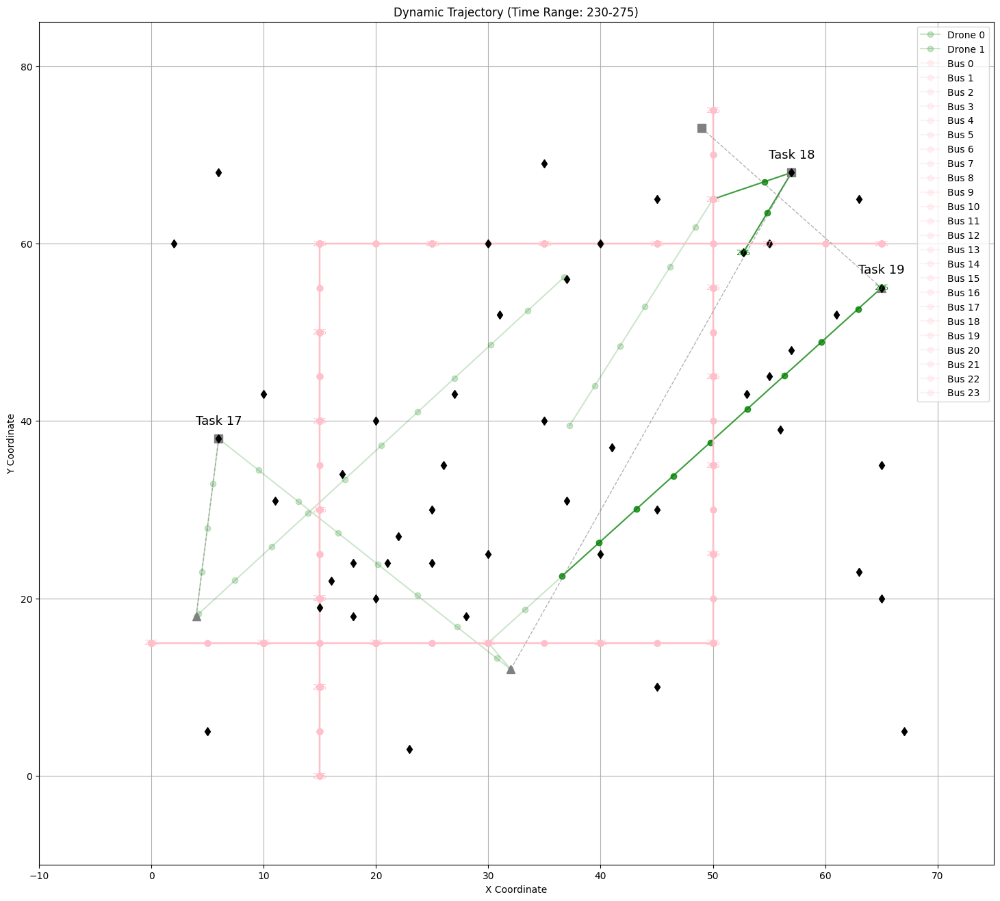

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import pandas as pd

def animate_and_save_simulation(simulation_records, task_list, package_records, save_path, time_range=(230, 290), selected_tasks=[17, 18, 19, 20], file_format="gif"):
    """
    根据 simulation_records 动态绘制轨迹图，只显示选定任务的连接线
    - bus: 粉色
    - pickup points: 灰色三角形
    - delivery points: 灰色正方形
    - 连接线: 虚线
    - drone: 绿色
    - package: 黑色
    """
    # 将模拟数据转换为 DataFrame 并过滤时间范围
    df = pd.DataFrame(simulation_records)
    df = df[(df["time"] >= time_range[0]) & (df["time"] <= time_range[1])]
    package_df = pd.DataFrame(package_records)
    package_df = package_df[(package_df["time"] >= time_range[0]) & (package_df["time"] <= time_range[1])]

    # 设置图表
    fig, ax = plt.subplots(figsize=(18, 16))
    ax.set_xlim(df["x"].min() - 10, df["x"].max() + 10)
    ax.set_ylim(df["y"].min() - 10, df["y"].max() + 10)
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.set_title(f"Dynamic Trajectory (Time Range: {time_range[0]}-{time_range[1]})")
    ax.grid(True)

    # 初始化绘图对象
    lines = {}
    texts = {}
    task_lines = {}
    pickup_points = {}
    delivery_points = {}
    package_markers = {}
    package_texts = {}

    # 更新实体颜色和标记
    for entity_type, marker, color in [("drone", "o", "green"), ("bus", "o", "pink")]:
        entity_df = df[df["entity"] == entity_type]
        for entity_id in entity_df["id"].unique():
            line, = ax.plot([], [], linestyle='-', marker=marker, color=color, alpha=0.2, label=f'{entity_type.capitalize()} {entity_id}')
            active_line, = ax.plot([], [], linestyle='-', marker=marker, color=color, alpha=0.7)
            text = ax.text(0, 0, "", fontsize=8, ha='center', va='center', color=color)
            lines[f"{entity_type}_{entity_id}"] = (line, active_line)
            texts[f"{entity_type}_{entity_id}"] = text

    # 仅为选定的任务创建虚线连线和标记点
    for task in task_list:
        if task['index'] in selected_tasks:  # 只处理选定的任务
            # 虚线连接
            line, = ax.plot([], [], linestyle='--', color='gray', alpha=0.6, linewidth=1)
            # 灰色三角形(pickup)
            pickup_point, = ax.plot([], [], linestyle='', marker='^', color='gray', markersize=8)
            # 灰色正方形(delivery)
            delivery_point, = ax.plot([], [], linestyle='', marker='s', color='gray', markersize=8)
            
            task_lines[task['pickup_task']] = line
            pickup_points[task['pickup_task']] = pickup_point
            delivery_points[task['pickup_task']] = delivery_point

    # 初始化包裹标记（保持黑色）
    for package_id in package_df["package_id"].unique():
        marker, = ax.plot([], [], linestyle='', marker='d', color='black', markersize=6)
        text = ax.text(0, 0, "", fontsize=13, ha='center', va='center', color='black')
        package_markers[package_id] = marker
        package_texts[package_id] = text

    ax.legend()

    # 更新函数
    def update(frame):
        current_time = frame
        time_df = df[df["time"] <= current_time]
        package_time_df = package_df[package_df["time"] == current_time]

        # 更新任务连线和点
        for task in task_list:
            if task['index'] in selected_tasks and task['pickup_time'] <= current_time:  # 只更新选定的任务
                # 更新虚线连接
                task_line = task_lines[task['pickup_task']]
                task_line.set_data(
                    [task['pickup_x'], task['delivery_x']],
                    [task['pickup_y'], task['delivery_y']]
                )
                # 更新pickup点（三角形）
                pickup_point = pickup_points[task['pickup_task']]
                pickup_point.set_data(task['pickup_x'], task['pickup_y'])
                # 更新delivery点（正方形）
                delivery_point = delivery_points[task['pickup_task']]
                delivery_point.set_data(task['delivery_x'], task['delivery_y'])

        # 更新实体轨迹
        for entity_type, marker, color in [("drone", "o", "green"), ("bus", "o", "pink")]:
            entity_df = time_df[time_df["entity"] == entity_type]
            for entity_id in entity_df["id"].unique():
                entity_data = entity_df[entity_df["id"] == entity_id]
                past_line, active_line = lines[f"{entity_type}_{entity_id}"]
                text = texts[f"{entity_type}_{entity_id}"]

                past_line.set_data(entity_data["x"], entity_data["y"])
                active_data = entity_data.tail(10)
                active_line.set_data(active_data["x"], active_data["y"])

                if not entity_data.empty:
                    text.set_position((entity_data.iloc[-1]["x"], entity_data.iloc[-1]["y"]))
                    text.set_text(f"{entity_data.iloc[-1]['time']}")

        # 更新包裹位置
        for _, package_row in package_time_df.iterrows():
            package_id = package_row["package_id"]
            x, y = package_row["x"], package_row["y"]
            task_id = package_row["task_id"]
            
            marker = package_markers[package_id]
            text = package_texts[package_id]
            
            marker.set_data(x, y)
            if task_id in selected_tasks:  # 只为选定的任务显示ID
                text.set_position((x, y + 2))
                text.set_text(f"Task {task_id}")
            else:
                text.set_text("")

    # 动画 - 降低帧率以放慢动画速度
    ani = FuncAnimation(fig, update, frames=range(time_range[0], time_range[1] + 1), 
                       interval=200,  # 增加间隔时间到200ms
                       repeat=False)

    # 保存动画 - 降低fps以使动画更慢
    ani.save(save_path, writer=PillowWriter(fps=5))  # 降低fps到3
    print(f"Animation saved to {save_path}")

# 调用函数，保存动画
save_path = "simulation_230_290_selected.gif"
animate_and_save_simulation(simulation_records, task_list, package_records, 
                          save_path, time_range=(230, 275), 
                          selected_tasks=[17, 18, 19],  # 指定要显示的任务
                          file_format="gif")

In [ ]:
# Filter tasks where both pickup_status and delivery_status are 'unassigned'
unassigned_tasks = [task for task in tasks if task['pickup_status'] == 'unassigned' or task['delivery_status'] == 'unassigned']

# Display the filtered tasks
unassigned_tasks

[]

In [ ]:
simulation_df.tail(10)


,time,entity,id,x,y,status,direction
28084,1000,bus,14,20.0,15.0,moving,-1.0
28085,1000,bus,15,50.0,55.0,moving,1.0
28086,1000,bus,16,15.0,40.0,moving,-1.0
28087,1000,bus,17,25.0,60.0,moving,1.0
28088,1000,bus,18,40.0,15.0,moving,-1.0
28089,1000,bus,19,50.0,35.0,moving,1.0
28090,1000,bus,20,15.0,60.0,moving,-1.0
28091,1000,bus,21,15.0,50.0,moving,1.0
28092,1000,bus,22,50.0,25.0,moving,-1.0
28093,1000,bus,23,50.0,15.0,moving,1.0


In [ ]:

# Load the data
df = simulation_df # Replace with the actual file path
# df = df.drop(columns=['Unnamed: 0'])  # Drop unnecessary column if it exists

# Calculate the difference in 'x' and 'y' coordinates for each 'id' to identify movement
df['x_diff'] = df.groupby('id')['x'].diff()
df['y_diff'] = df.groupby('id')['y'].diff()

# Determine if a drone was moving based on changes in 'x' or 'y' coordinates
df['moving'] = (df['x_diff'] != 0) | (df['y_diff'] != 0)

# Find the last time each drone was moving
last_movement_times = df[df['moving']].groupby('id')['time'].max()

# Display the last movement times
print(last_movement_times)

id
0     1000
1     1000
2     1000
3     1000
4     1000
5      999
6      999
7      999
8      999
9      999
10     999
11     999
12     999
13     999
14     999
15     999
16     999
17     999
18     999
19     999
20     999
21     999
22     999
23     999
Name: time, dtype: int64


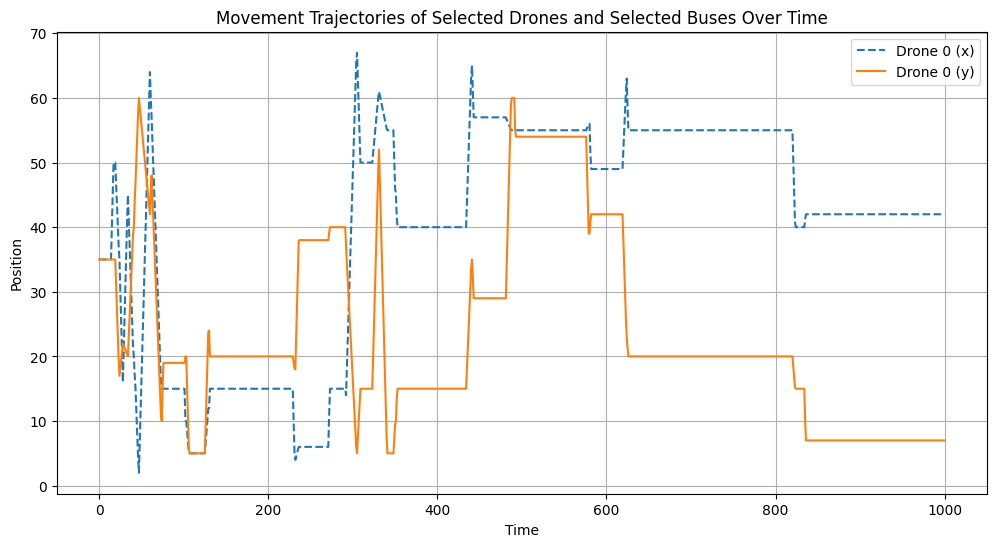

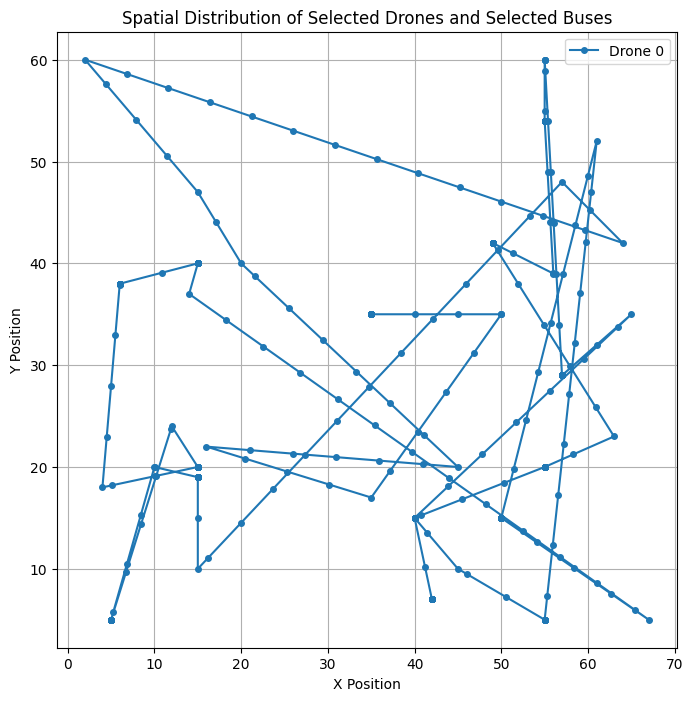

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 假设 simulation_df 已经包含了所有记录
# 从列表中创建 DataFrame (如果还未创建)
simulation_df = pd.DataFrame(simulation_records)

# 将数据分成无人机和巴士
drones_df = simulation_df[simulation_df['entity'] == 'drone']
buses_df = simulation_df[simulation_df['entity'] == 'bus']

# Function to plot selected drones and selected buses
def plot_selected_drones_and_buses(drones_to_plot, buses_to_plot):
    # 1. 绘制无人机和巴士的运动轨迹随时间的变化
    plt.figure(figsize=(12, 6))
    for drone_id in drones_to_plot:
        drone_data = drones_df[drones_df['id'] == drone_id]
        if not drone_data.empty:
            plt.plot(drone_data['time'], drone_data['x'], label=f'Drone {drone_id} (x)', linestyle='--')
            plt.plot(drone_data['time'], drone_data['y'], label=f'Drone {drone_id} (y)')
    
    for bus_id in buses_to_plot:
        bus_data = buses_df[buses_df['id'] == bus_id]
        if not bus_data.empty:
            plt.plot(bus_data['time'], bus_data['x'], label=f'Bus {bus_id} (x)')
            plt.plot(bus_data['time'], bus_data['y'], label=f'Bus {bus_id} (y)', linestyle='--')

    plt.title("Movement Trajectories of Selected Drones and Selected Buses Over Time")
    plt.xlabel("Time")
    plt.ylabel("Position")
    plt.legend()
    plt.grid()
    plt.show()

    # 2. 绘制无人机和巴士的空间位置分布
    plt.figure(figsize=(8, 8))
    for drone_id in drones_to_plot:
        drone_data = drones_df[drones_df['id'] == drone_id]
        if not drone_data.empty:
            plt.plot(drone_data['x'], drone_data['y'], label=f'Drone {drone_id}', marker='o', markersize=4, linestyle='-')
    
    for bus_id in buses_to_plot:
        bus_data = buses_df[buses_df['id'] == bus_id]
        if not bus_data.empty:
            plt.plot(bus_data['x'], bus_data['y'], label=f'Bus {bus_id}', marker='x', markersize=5, linestyle='--')

    plt.title("Spatial Distribution of Selected Drones and Selected Buses")
    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.legend()
    plt.grid()
    plt.show()

# Example usage: Plot trajectories for drones with IDs [1, 3, 8] and buses with IDs [0, 2]
selected_drones = [0]
selected_buses = []
plot_selected_drones_and_buses(selected_drones, selected_buses)

In [ ]:
tasks

[{'index': 0,
  'pickup_task': 12.0,
  'pickup_time': 15.0,
  'delivery_task': 95.0,
  'pickup_x': 50.0,
  'pickup_y': 35.0,
  'delivery_x': 25.0,
  'delivery_y': 24.0,
  'distance': 27.313000567495326,
  'pickup_status': 'completed',
  'delivery_status': 'completed',
  'package_id': 0,
  'line': 'Line 2'},
 {'index': 1,
  'pickup_task': 2.0,
  'pickup_time': 18.0,
  'delivery_task': 85.0,
  'pickup_x': 35.0,
  'pickup_y': 17.0,
  'delivery_x': 16.0,
  'delivery_y': 22.0,
  'distance': 19.6468827043885,
  'pickup_status': 'completed',
  'delivery_status': 'completed',
  'package_id': 1},
 {'index': 2,
  'pickup_task': 21.0,
  'pickup_time': 18.0,
  'delivery_task': 18.0,
  'pickup_x': 45.0,
  'pickup_y': 20.0,
  'delivery_x': 20.0,
  'delivery_y': 40.0,
  'distance': 32.01562118716424,
  'pickup_status': 'completed',
  'delivery_status': 'completed',
  'package_id': 2},
 {'index': 3,
  'pickup_task': 5.0,
  'pickup_time': 20.0,
  'delivery_task': 93.0,
  'pickup_x': 15.0,
  'pickup_y':